In [1]:
import numpy as np
import pandas as pd
from pandas.plotting import scatter_matrix

from datetime import datetime

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.colors import ListedColormap

# from scipy.interpolate import BPoly

# import seaborn as sns

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score


In [2]:
today_str = datetime.today().strftime("%Y%m%d")
today_str


'20260301'

In [3]:
start_date = '1950-01-01'
end_date = '2025-09-30'


In [4]:
custom_colors = [
    '#0000d0',    # vivid blue
    '#d00000',    # vivid red
    '#f48c06',    # bright orange
    # '#ffc300',    # strong yellow
    '#8338ec',    # vivid purple / magenta-ish
    '#50a000',    # dark green with some yellow
    #'#222222',    # charcoal black gray
    # '#3a86ff'     # strong royal blue
]

my_cmap = ListedColormap(custom_colors)


In [5]:
quarterly_df = pd.read_pickle("../data/prepared_quarterly_data_smoothed_20260301.pickle")


In [6]:
quarterly_df.columns.values.tolist()

['10yr_ustreas',
 '10yr_ustreas_d1',
 '10yr_ustreas_d2',
 '10yr_ustreas_d3',
 'credit_spread',
 'credit_spread_d1',
 'credit_spread_d2',
 'credit_spread_d3',
 'div_minus_baa',
 'div_minus_baa_d1',
 'div_minus_baa_d2',
 'div_minus_baa_d3',
 'fred_aaa',
 'fred_aaa_d1',
 'fred_aaa_d2',
 'fred_aaa_d3',
 'fred_baa',
 'fred_baa_d1',
 'fred_baa_d2',
 'fred_baa_d3',
 'fred_gs10',
 'fred_gs10_d1',
 'fred_gs10_d2',
 'fred_gs10_d3',
 'fred_tb3ms',
 'fred_tb3ms_d1',
 'fred_tb3ms_d2',
 'fred_tb3ms_d3',
 'gdp_growth',
 'gdp_growth_d1',
 'gdp_growth_d2',
 'gdp_growth_d3',
 'log_cape_shiller',
 'log_cape_shiller_d1',
 'log_cape_shiller_d2',
 'log_cape_shiller_d3',
 'log_cpi',
 'log_cpi_d1',
 'log_cpi_d2',
 'log_cpi_d3',
 'log_div_yield',
 'log_div_yield2',
 'log_div_yield2_d1',
 'log_div_yield2_d2',
 'log_div_yield2_d3',
 'log_div_yield_d1',
 'log_div_yield_d2',
 'log_div_yield_d3',
 'log_dividend',
 'log_dividend_d1',
 'log_dividend_d2',
 'log_dividend_d3',
 'log_earn',
 'log_earn_d1',
 'log_earn_d2'

In [7]:
vars_to_consider = [
    # '10yr_ustreas',
    '10yr_ustreas_d1',
    '10yr_ustreas_d2',
    # '10yr_ustreas_d3',
    'credit_spread',
    'credit_spread_d1',
    # 'credit_spread_d2',
    # 'credit_spread_d3',
    # 'div_minus_baa',
    'div_minus_baa_d1',
    'div_minus_baa_d2',
    # 'div_minus_baa_d3',
    # 'fred_aaa',
    'fred_aaa_d1',
    'fred_aaa_d2',
    # 'fred_aaa_d3',
    # 'fred_baa',
    'fred_baa_d1',
    'fred_baa_d2',
    # 'fred_baa_d3',
    # 'fred_gs10',
    'fred_gs10_d1',
    'fred_gs10_d2',
    # 'fred_gs10_d3',
    # 'fred_tb3ms',
    'fred_tb3ms_d1',
    'fred_tb3ms_d2',
    # 'fred_tb3ms_d3',
    'gdp_growth',
    'gdp_growth_d1',
    # 'gdp_growth_d2',
    # 'gdp_growth_d3',
    # 'log_cape_shiller',
    'log_cape_shiller_d1',
    'log_cape_shiller_d2',
    # 'log_cape_shiller_d3',
    # 'log_cpi',
    'log_cpi_d1',
    'log_cpi_d2',
    # 'log_cpi_d3',
    # 'log_div_yield',
    'log_div_yield_d1',
    'log_div_yield_d2',
    # 'log_div_yield_d3',
    # 'log_div_yield2',
    'log_div_yield2_d1',
    'log_div_yield2_d2',
    # 'log_div_yield2_d3',
    # 'log_dividend',
    'log_dividend_d1',
    'log_dividend_d2',
    # 'log_dividend_d3',
    # 'log_earn',
    'log_earn_d1',
    'log_earn_d2',
    # 'log_earn_d3',
    # 'log_earn_yld',
    'log_earn_yld_d1',
    'log_earn_yld_d2',
    # 'log_earn_yld_d3',
    # 'log_fed_debt',
    'log_fed_debt_d1',
    'log_fed_debt_d2',
    # 'log_fed_debt_d3',
    # 'log_fred_cpi',
    'log_fred_cpi_d1',
    'log_fred_cpi_d2',
    # 'log_fred_cpi_d3',
    # 'log_fred_gdp',
    'log_fred_gdp_d1',
    'log_fred_gdp_d2',
    # 'log_fred_gdp_d3',
    # 'log_fred_gnp',
    'log_fred_gnp_d1',
    'log_fred_gnp_d2',
    # 'log_fred_gnp_d3',
    # 'log_gdp',
    'log_gdp_d1',
    'log_gdp_d2',
    # 'log_gdp_d3',
    # 'log_price_div',
    'log_price_div_d1',
    'log_price_div_d2',
    # 'log_price_div_d3',
    # 'log_price_gdp',
    'log_price_gdp_d1',
    'log_price_gdp_d2',
    # 'log_price_gdp_d3',
    # 'log_price_gdp2',
    'log_price_gdp2_d1',
    'log_price_gdp2_d2',
    # 'log_price_gdp2_d3',
    # 'log_price_gnp2',
    'log_price_gnp2_d1',
    'log_price_gnp2_d2',
    # 'log_price_gnp2_d3',
    # 'log_real_gdp',
    'log_real_gdp_d1',
    'log_real_gdp_d2',
    # 'log_real_gdp_d3',
    # 'log_real_price2',
    'log_real_price2_d1',
    'log_real_price2_d2',
    # 'log_real_price2_d3',
    # 'log_real_price3',
    'log_real_price3_d1',
    'log_real_price3_d2',
    # 'log_real_price3_d3',
    # 'log_real_price_gdp2',
    'log_real_price_gdp2_d1',
    'log_real_price_gdp2_d2',
    # 'log_real_price_gdp2_d3',
    # 'log_sp500',
    'log_sp500_d1',
    'log_sp500_d2',
    'log_sp500_d3',
    # 'log_sp500_adj',
    'log_sp500_adj_d1',
    'log_sp500_adj_d2',
    'log_sp500_adj_d3',
    # 'log_us_pop',
    # 'log_us_pop_d1',
    # 'log_us_pop_d2',
    # 'log_us_pop_d3',
    'real_gdp_growth',
    'real_gdp_growth_d1',
    # 'real_gdp_growth_d2',
    # 'real_gdp_growth_d3',
    # 'real_gdp_per_cap',
    'real_gdp_per_cap_d1',
    'real_gdp_per_cap_d2',
    # 'real_gdp_per_cap_d3',
    'sp500_pe',
    'sp500_pe_d1',
    # 'sp500_pe_d2',
    # 'sp500_pe_d3',
    'us_infl',
    'us_infl_d1',
    # 'us_infl_d2',
    # 'us_infl_d3',
    # 'us_pop_growth',
    # 'us_pop_growth_d1',
    # 'us_pop_growth_d2',
    # 'us_pop_growth_d3',
]

10yr_ustreas_d1


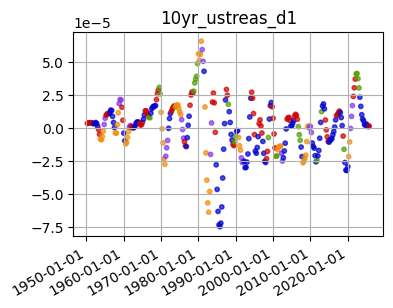



10yr_ustreas_d2


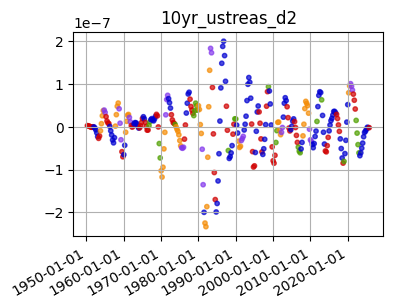



credit_spread


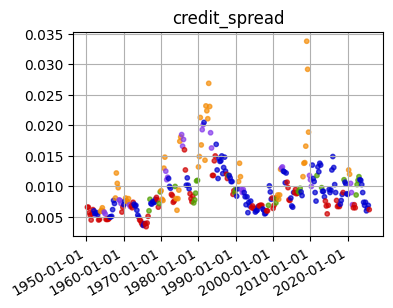



credit_spread_d1


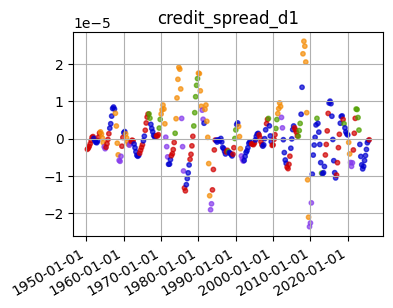



div_minus_baa_d1


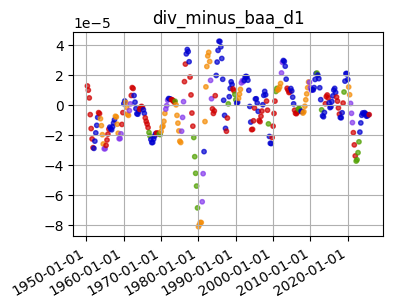



div_minus_baa_d2


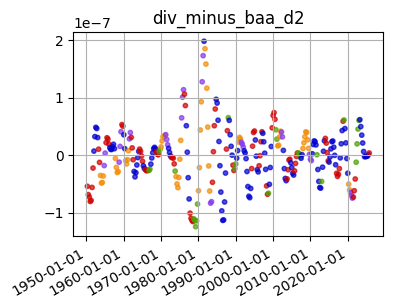



fred_aaa_d1


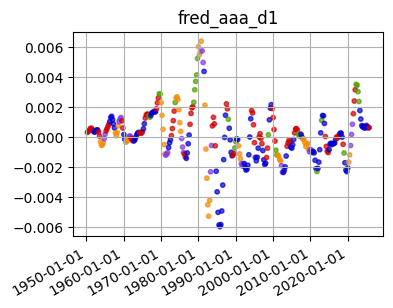



fred_aaa_d2


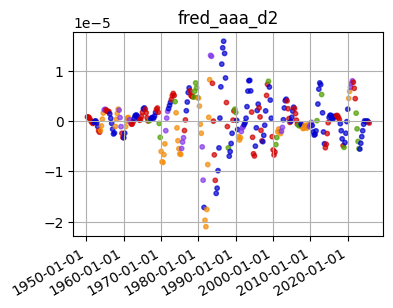



fred_baa_d1


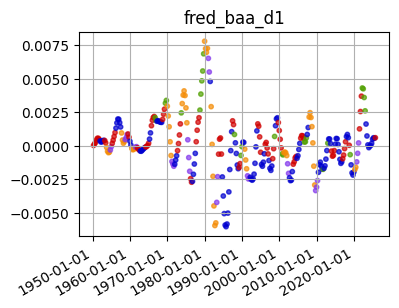



fred_baa_d2


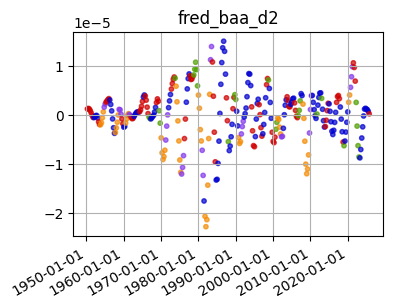



fred_gs10_d1


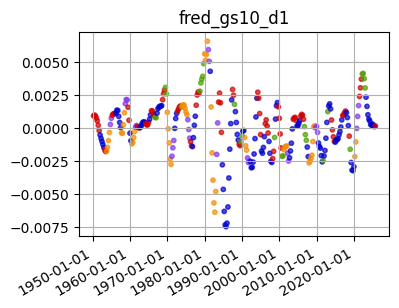



fred_gs10_d2


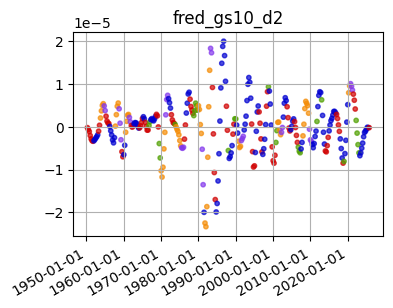



fred_tb3ms_d1


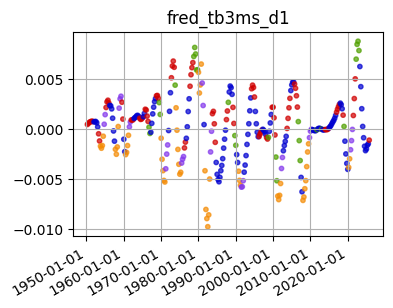



fred_tb3ms_d2


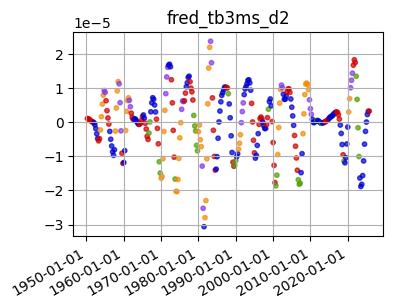



gdp_growth


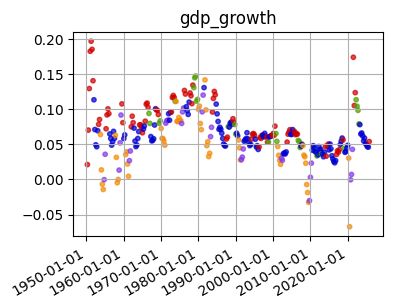



gdp_growth_d1


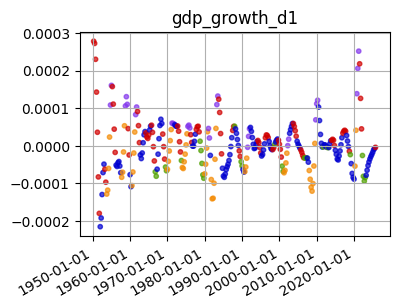



log_cape_shiller_d1


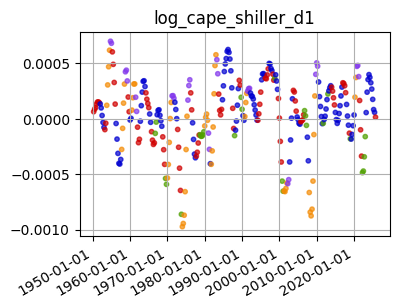



log_cape_shiller_d2


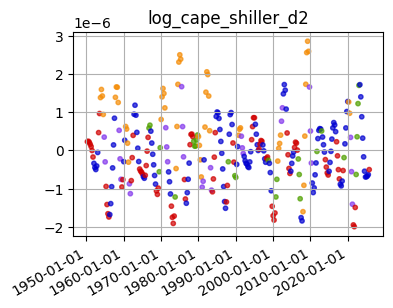



log_cpi_d1


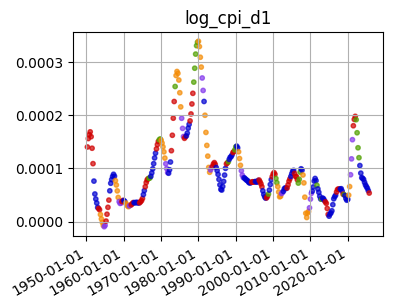



log_cpi_d2


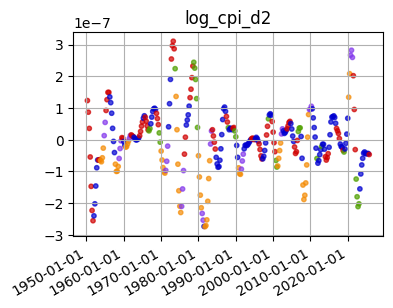



log_div_yield_d1


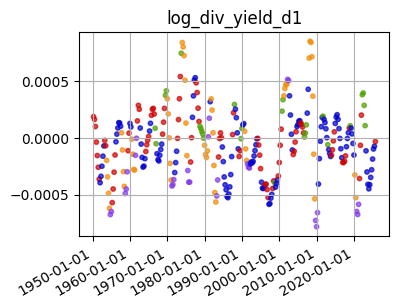



log_div_yield_d2


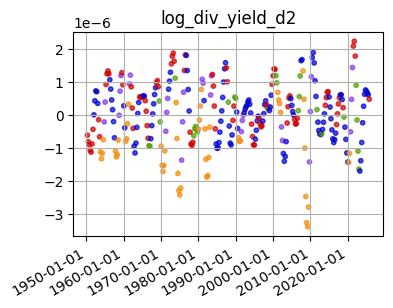



log_div_yield2_d1


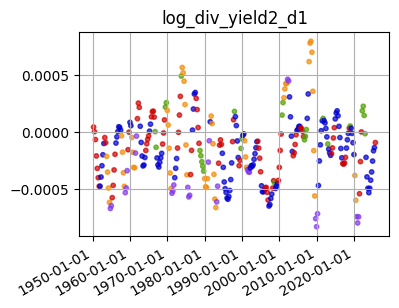



log_div_yield2_d2


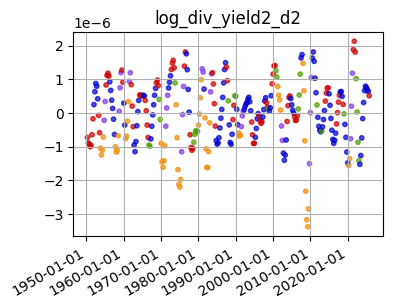



log_dividend_d1


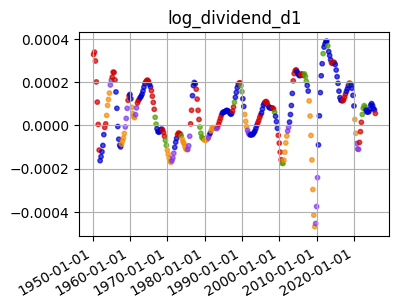



log_dividend_d2


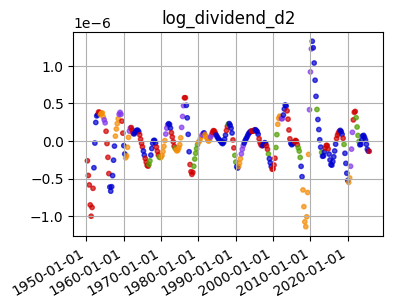



log_earn_d1


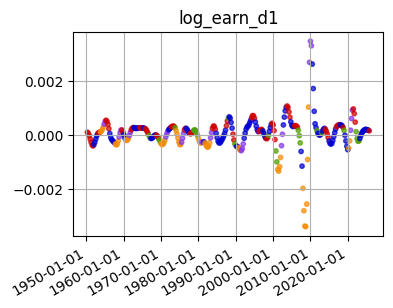



log_earn_d2


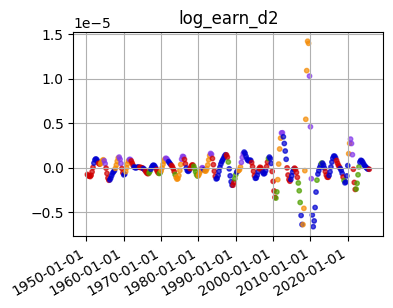



log_earn_yld_d1


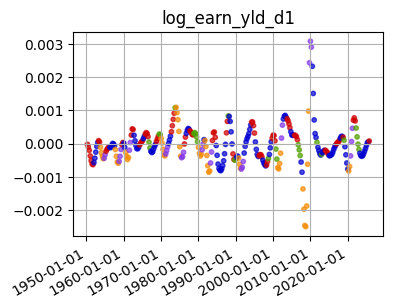



log_earn_yld_d2


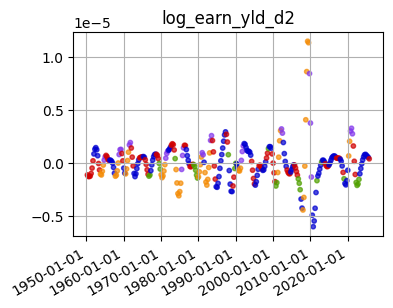



log_fed_debt_d1


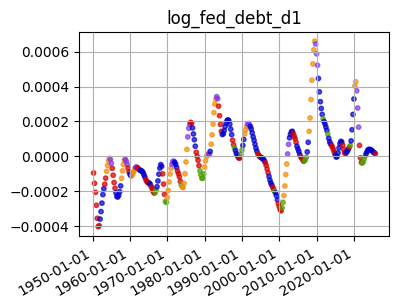



log_fed_debt_d2


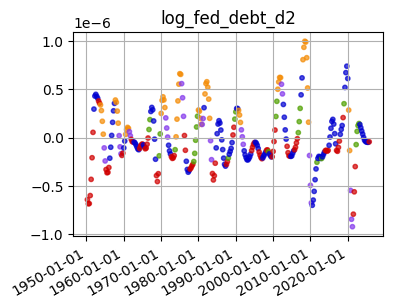



log_fred_cpi_d1


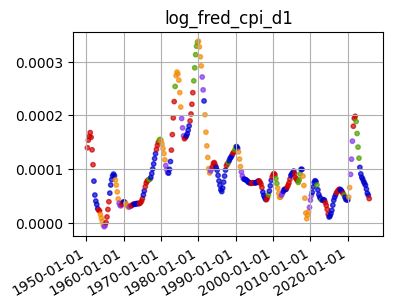



log_fred_cpi_d2


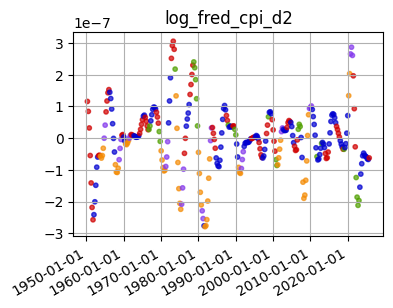



log_fred_gdp_d1


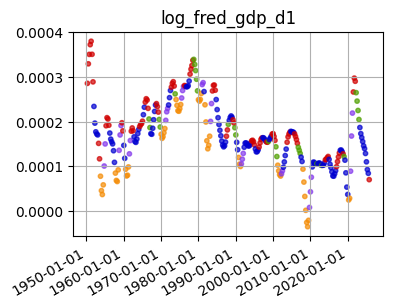



log_fred_gdp_d2


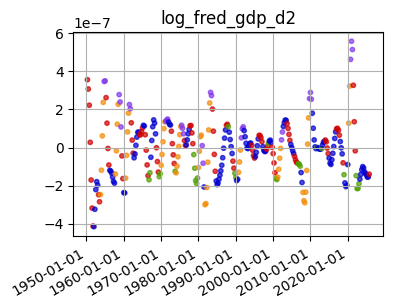



log_fred_gnp_d1


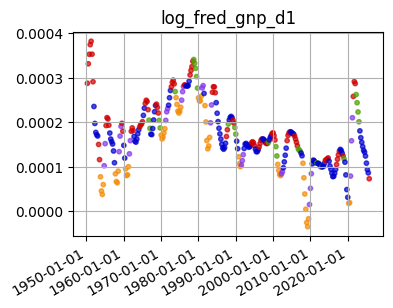



log_fred_gnp_d2


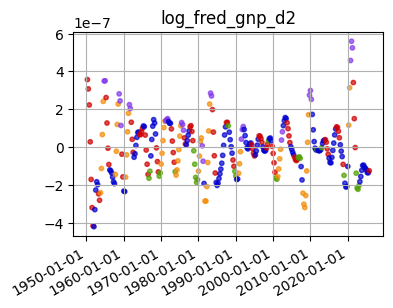



log_gdp_d1


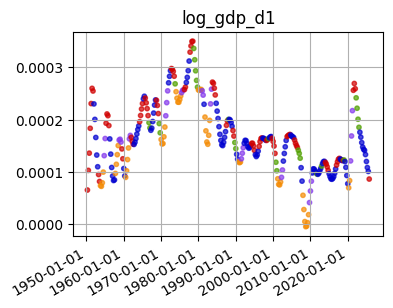



log_gdp_d2


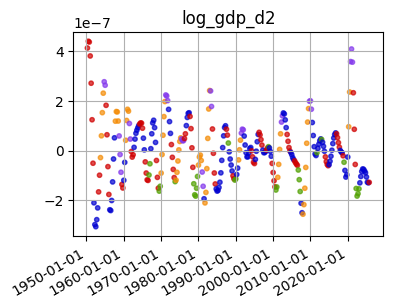



log_price_div_d1


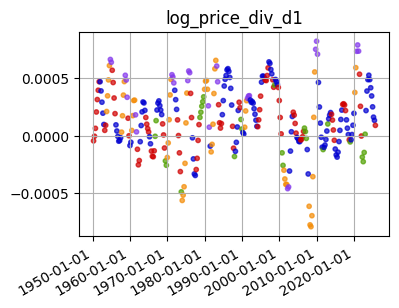



log_price_div_d2


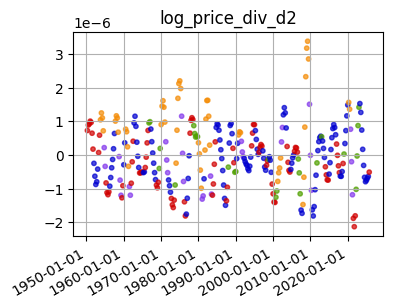



log_price_gdp_d1


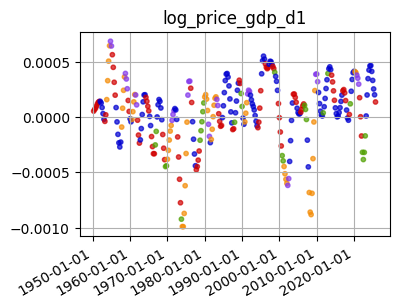



log_price_gdp_d2


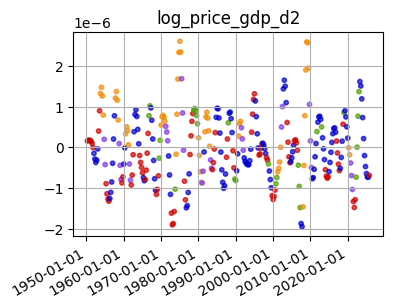



log_price_gdp2_d1


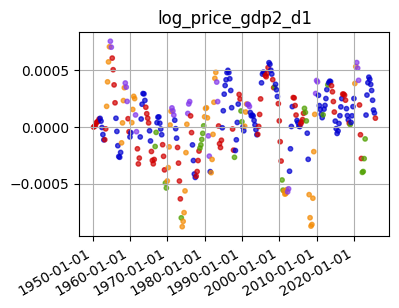



log_price_gdp2_d2


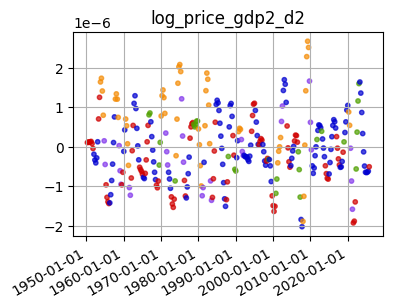



log_price_gnp2_d1


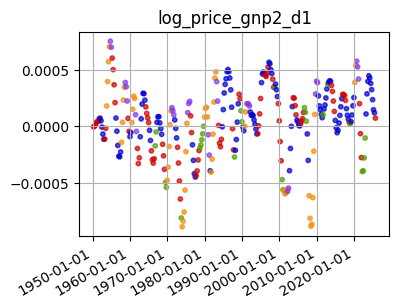



log_price_gnp2_d2


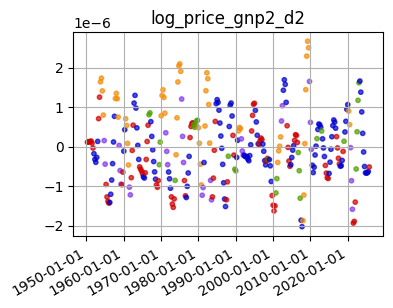



log_real_gdp_d1


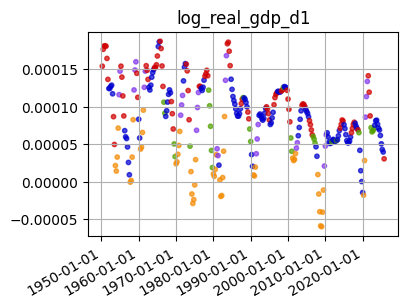



log_real_gdp_d2


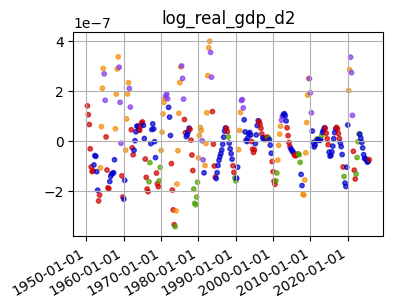



log_real_price2_d1


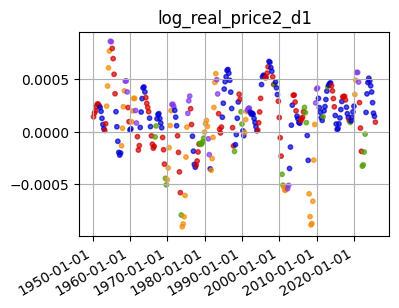



log_real_price2_d2


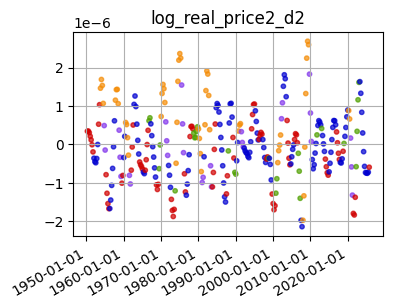



log_real_price3_d1


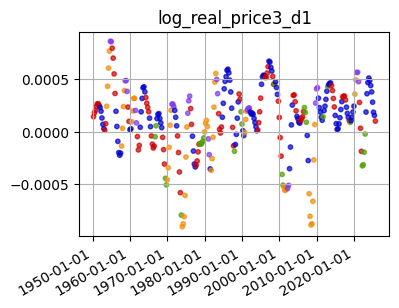



log_real_price3_d2


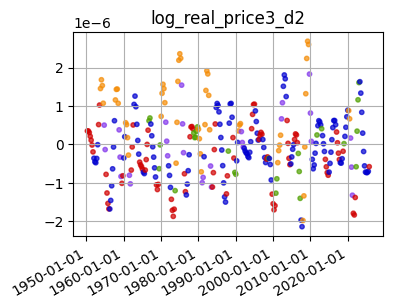



log_real_price_gdp2_d1


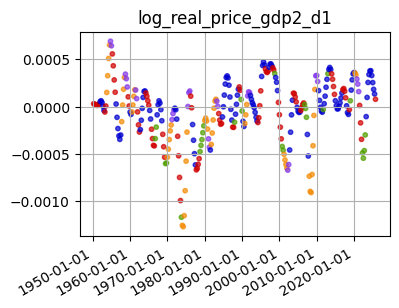



log_real_price_gdp2_d2


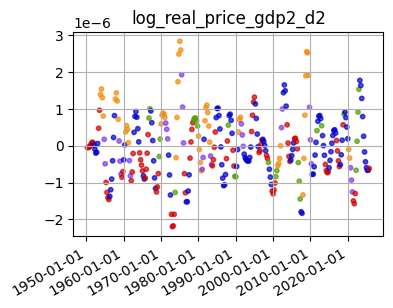



log_sp500_d1


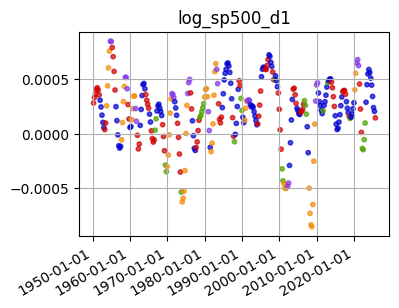



log_sp500_d2


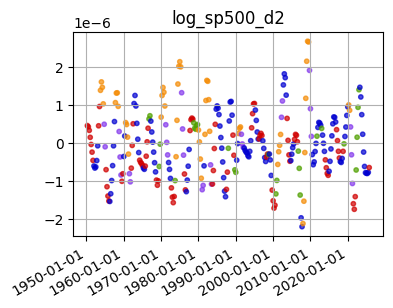



log_sp500_d3


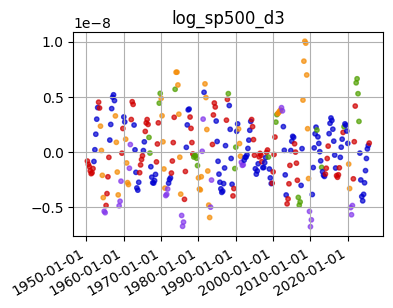



log_sp500_adj_d1


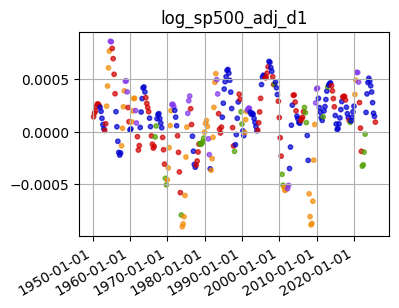



log_sp500_adj_d2


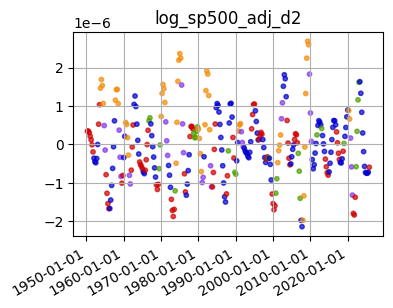



log_sp500_adj_d3


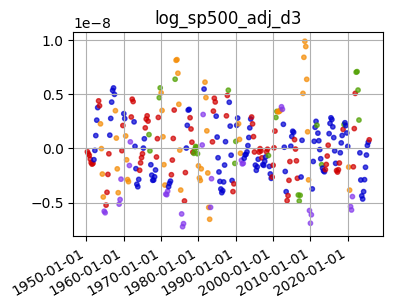



real_gdp_growth


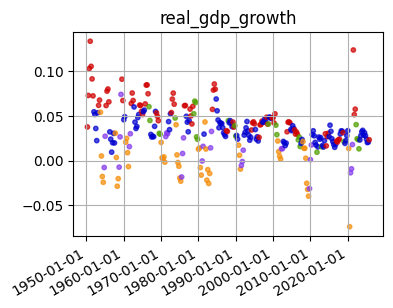



real_gdp_growth_d1


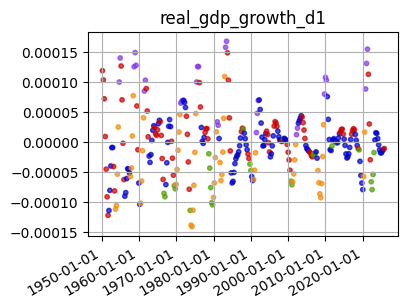



real_gdp_per_cap_d1


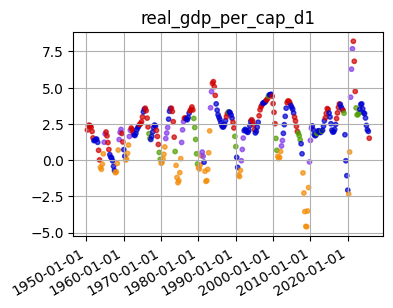



real_gdp_per_cap_d2


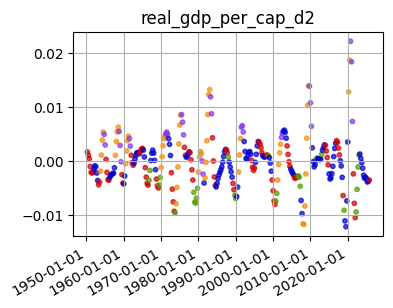



sp500_pe


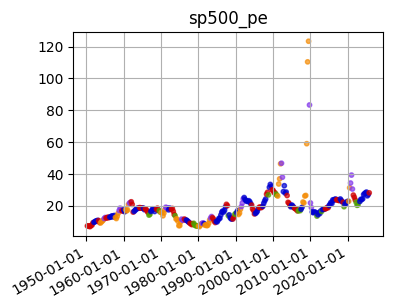



sp500_pe_d1


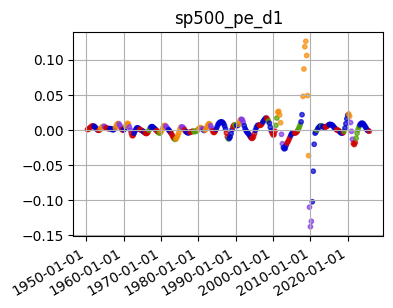



us_infl


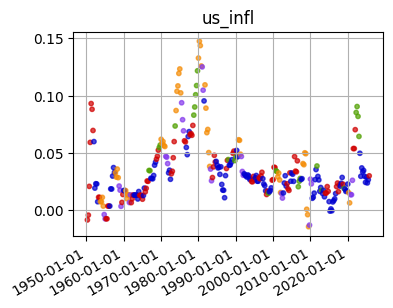



us_infl_d1


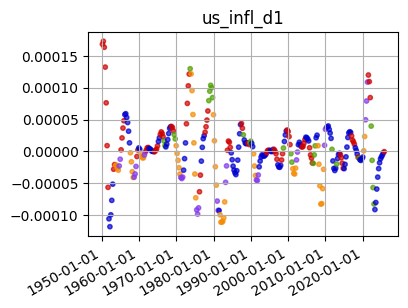

In [8]:
for col_name in vars_to_consider:
    if col_name == 'market_code':
        continue

    print(col_name)

    orig_all_dates = quarterly_df.index.values
    orig_all_date_string = [datetime.strptime(str(d), '%Y-%m-%d').date() for d in orig_all_dates]
    values = quarterly_df[col_name].values
    regimes = quarterly_df['market_code'].values
    num_nulls = int(quarterly_df[col_name].isna().sum())
    # print("min date = " + str(orig_all_date_string[0]))
    # print("max date = " + str(orig_all_date_string[-1]))
    # print("num nulls " + str(num_nulls) )

    fig, ax = plt.subplots(figsize=(4, 3))

    plt.scatter(
        x=orig_all_date_string, y=values,
        c=regimes, cmap=my_cmap, # good maps include 'viridis' 'Set1' 'tab10' 'Accent' 'rainbow' 'turbo'
        s=10, # use 20 for a 8x5 plot, but 10 is better for smaller plots
        alpha=0.7,
        linestyle='solid', marker='o')

    formatter = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(formatter)
    fig.autofmt_xdate()
    plt.title(col_name)
    plt.grid(True)
    plt.show()

    print()
    print()


In [ ]:
# sns.pairplot(
#     data = quarterly_df,
#     # vars = ['book','dividend','sp500','sales','gdp','fred_gnp'],
#     vars = vars_to_consider,
#     hue  = "market_code",
#     # optional but very useful tweaks:
#     # diag_kind = "kde",      # or "hist", "auto"
#     # kind      = "scatter",  # default anyway
#     # palette   = "Set1",     # or "tab10", "husl", your custom list, etc.
#     # height    = 2.5,        # size per panel — keep small if many variables
#     # aspect    = 1.1,
#     # corner    = True,       # triangular = less redundancy (often cleaner)
#     # plot_kws  = {"s": 40, "alpha": 0.7, "edgecolor": "none"},
#     #diag_kws  = {"alpha": 0.6}
# );


In [ ]:
# # colors = quarterly_df['market_code'].map(my_cmap)
# # temp_data = quarterly_df[['book','dividend','sp500','sales','gdp','fred_gnp', 'market_code']].dropna()
# # temp_data = quarterly_df[vars_to_consider].dropna()
# temp_data = quarterly_df.dropna()
# regimes = temp_data['market_code'].values

# scatter_matrix(
#     # temp_data[['book','dividend','sp500','sales','gdp','fred_gnp']], #.select_dtypes(include='number'),
#     temp_data,
#     figsize   = (11, 11),
#     alpha     = 0.6,
#     c         = regimes,
#     cmap      = my_cmap,
#     diagonal  = 'kde',
#     marker    = 'o',
#     s         = 25,                       # point size
#     hist_kwds = {'bins': 20, 'alpha': 0.7},
#     range_padding = 0.05
# )

# # Add a legend manually (scatter_matrix doesn't do it automatically)
# # from matplotlib.lines import Line2D
# # legend_elements = [
# #     Line2D([0], [0], marker='o', color='w', label=label,
# #            markerfacecolor=plt.cm.Set1(i/2), markersize=8)
# #     for i, label in enumerate(['control', 'treatment_A', 'treatment_B'])
# # ]

# # plt.legend(handles=legend_elements, title='Condition', 
# #            loc='upper right', bbox_to_anchor=(1.25, 1))

# plt.suptitle("Pairwise relationships colored by experimental condition", 
#              y=0.95, fontsize=14)
# plt.tight_layout()
# plt.show()


In [9]:
len(quarterly_df)

303

In [10]:
# note: the prepared dataset should not have any missing values
# but we always need to ensure this before re-scaling

X = quarterly_df[vars_to_consider].dropna().values


In [11]:
len(X)

303

In [12]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [13]:
pca = PCA(n_components=5)
X_reduced = pca.fit_transform(X_scaled)
reduced_df = pd.DataFrame(X_reduced, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
print(pca.explained_variance_ratio_)

[0.25469153 0.2266618  0.10302078 0.09115494 0.05766397]


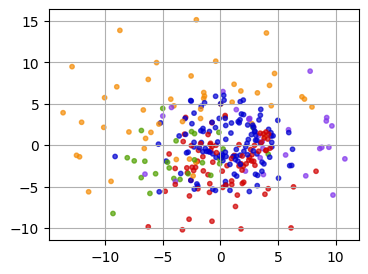

In [14]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC2'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


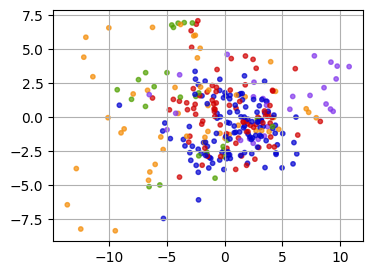

In [15]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC3'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


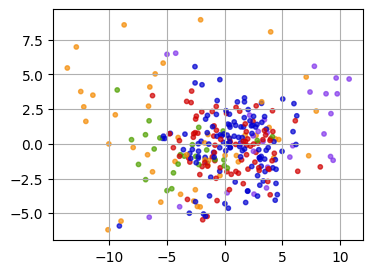

In [16]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC4'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


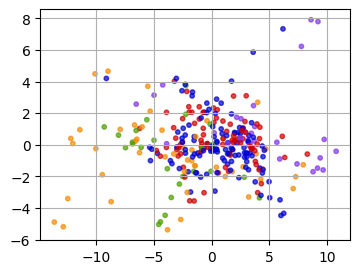

In [17]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC5'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


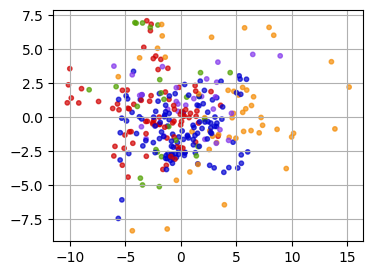

In [18]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC2'], y=reduced_df['PC3'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


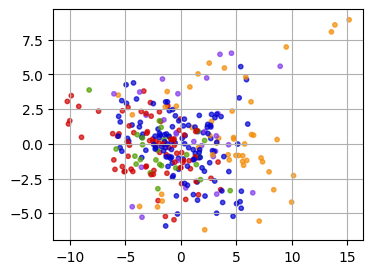

In [19]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC2'], y=reduced_df['PC4'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


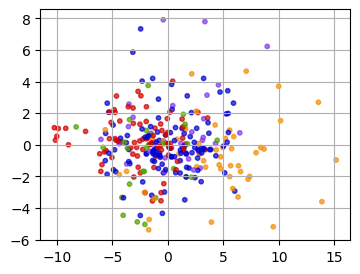

In [20]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC2'], y=reduced_df['PC5'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


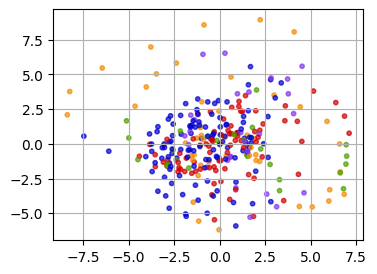

In [21]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC3'], y=reduced_df['PC4'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


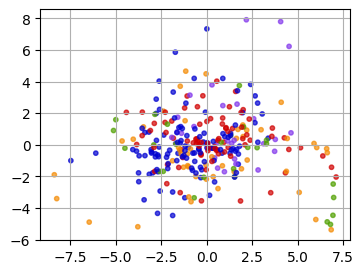

In [22]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC3'], y=reduced_df['PC5'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


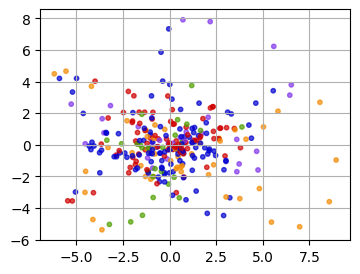

In [23]:
fig, ax = plt.subplots(figsize=(4, 3))

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].dropna())['market_code'].values

plt.scatter(
    x=reduced_df['PC4'], y=reduced_df['PC5'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


In [24]:
reduced_df

,PC1,PC2,PC3,PC4,PC5
0,2.741758,-1.168869,3.607927,2.734981,1.062116
1,2.471650,-1.803898,4.265111,1.620622,0.443941
2,1.810090,-2.261257,4.513092,0.172679,-0.291841
3,0.581056,-2.483165,4.324423,-2.194936,-1.772962
4,-0.651197,-2.052420,3.516950,-4.090619,-3.030488
...,...,...,...,...,...
298,2.360280,-1.158691,-2.680200,-1.631163,-0.642456
299,1.391129,-1.326192,-2.817624,-0.933993,-0.565125
300,0.500474,-1.367853,-3.032856,-0.263756,-0.444812
301,0.185884,-1.233092,-3.052839,-0.010988,-0.305061


In [25]:
X = reduced_df.values

In [26]:
# from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(X)

In [27]:
results = []

for k in range(2, 12):
    km = KMeans(n_clusters=k, n_init=50, random_state=0)
    labels = km.fit_predict(X)

    results.append({
        "k": k,
        "inertia": km.inertia_,
        "silhouette": silhouette_score(X, labels),
        "calinski": calinski_harabasz_score(X, labels),
        "davies_bouldin": davies_bouldin_score(X, labels)
    })

scores = pd.DataFrame(results)
print(scores.sort_values("silhouette", ascending=False))


    k      inertia  silhouette   calinski  davies_bouldin
6   8   680.541346    0.199784  51.674262        1.239607
2   4  1004.641453    0.198498  50.630735        1.555994
0   2  1303.256905    0.197502  48.904150        2.219961
7   9   635.285308    0.193156  50.889757        1.261602
5   7   727.526748    0.192847  53.398285        1.333108
4   6   799.602087    0.192480  53.144729        1.344467
1   3  1128.025261    0.191970  51.458254        1.780462
9  11   562.325059    0.190358  49.469800        1.196541
8  10   599.946022    0.187704  49.654618        1.276443
3   5   900.901749    0.174429  50.782807        1.474921


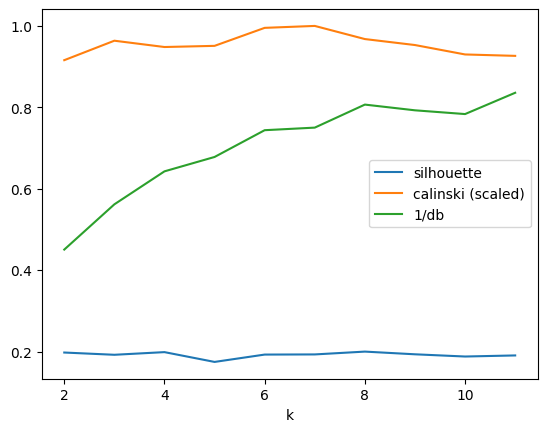

In [28]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots()

ax.plot(scores.k, scores.silhouette, label='silhouette')
ax.plot(scores.k, scores.calinski / scores.calinski.max(), label='calinski (scaled)')
ax.plot(scores.k, 1 / scores.davies_bouldin, label='1/db')

ax.set_xlabel("k")
ax.legend()
plt.show()

In [29]:
best_k = scores.loc[scores.silhouette.idxmax(), 'k']
print(int(best_k))

new_best_k = min(5, best_k)
print(int(new_best_k))

model = KMeans(n_clusters=int(new_best_k), n_init=100, random_state=42)
reduced_df['cluster'] = model.fit_predict(X)


8
5


In [30]:
from k_means_constrained import KMeansConstrained

n = len(X)
k = 5
size = n // k

clf = KMeansConstrained(
    n_clusters=k,
    size_min=size-2,
    size_max=size+2,
    random_state=0
)

labels = clf.fit_predict(X)
reduced_df['balanced_cluster'] = labels

shorter_regimes = (quarterly_df[vars_to_consider + ['market_code']].copy().dropna())['market_code'].values


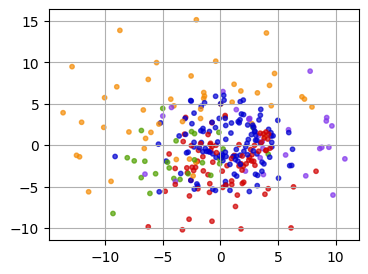

In [31]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC2'],
    c=shorter_regimes, cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


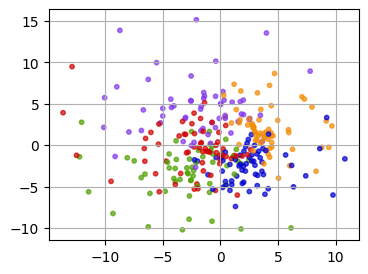

In [32]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC2'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


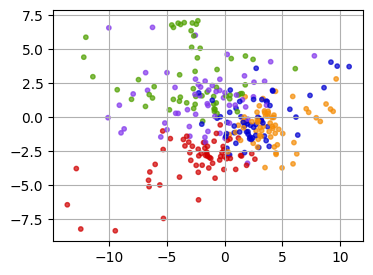

In [33]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC3'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


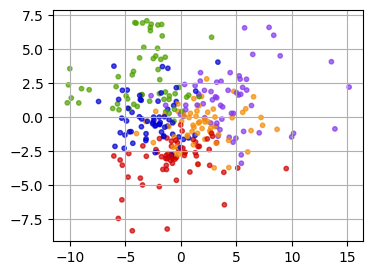

In [34]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC2'], y=reduced_df['PC3'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


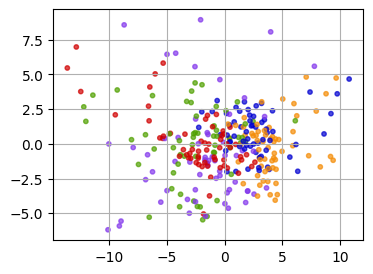

In [35]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC4'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


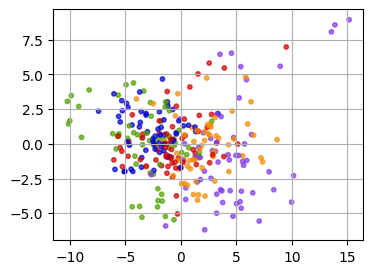

In [36]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC2'], y=reduced_df['PC4'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


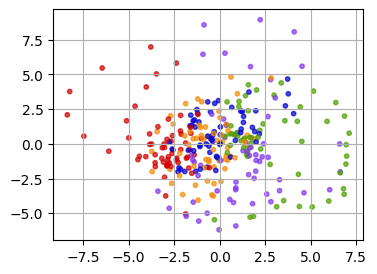

In [37]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC3'], y=reduced_df['PC4'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


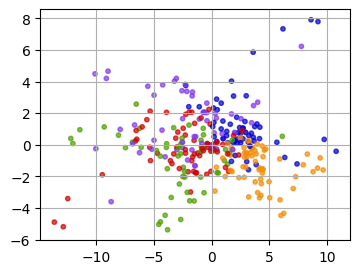

In [38]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC1'], y=reduced_df['PC5'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


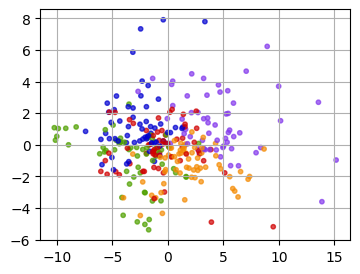

In [39]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC2'], y=reduced_df['PC5'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


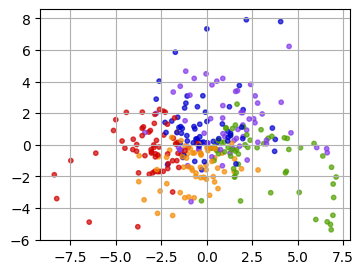

In [40]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC3'], y=reduced_df['PC5'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


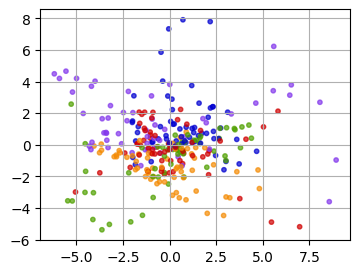

In [41]:
fig, ax = plt.subplots(figsize=(4, 3))

plt.scatter(
    x=reduced_df['PC4'], y=reduced_df['PC5'],
    c=reduced_df['balanced_cluster'], cmap=my_cmap,
    s=10,
    alpha=0.7,
    linestyle='solid', marker='o')
plt.grid(True)
plt.show()


10yr_ustreas


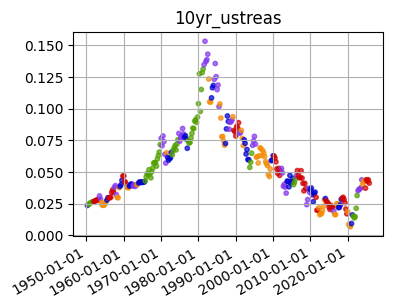



10yr_ustreas_d1


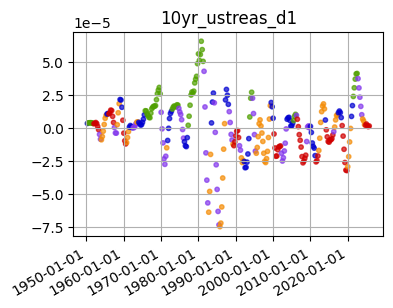



10yr_ustreas_d2


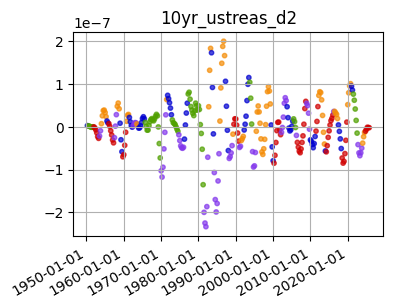



10yr_ustreas_d3


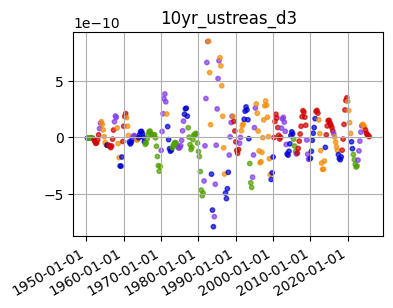



credit_spread


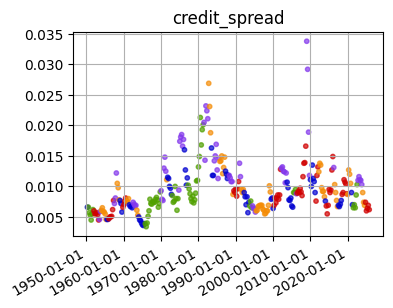



credit_spread_d1


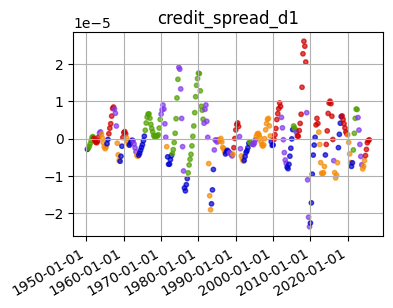



credit_spread_d2


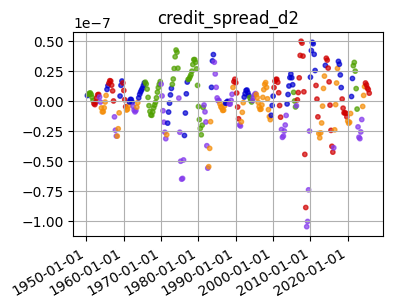



credit_spread_d3


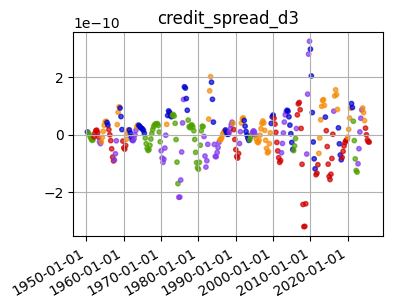



div_minus_baa


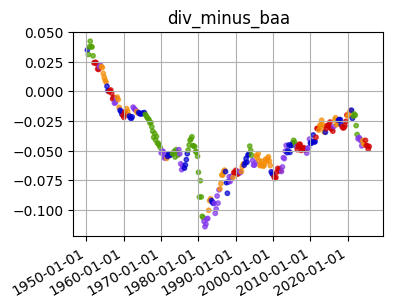



div_minus_baa_d1


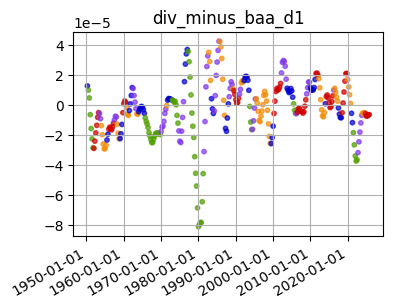



div_minus_baa_d2


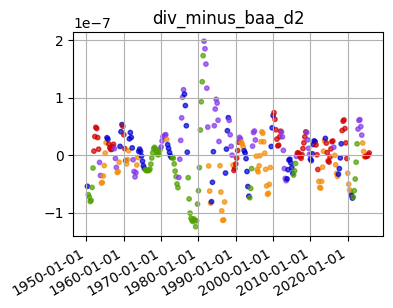



div_minus_baa_d3


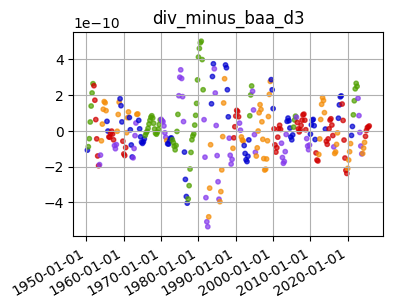



fred_aaa


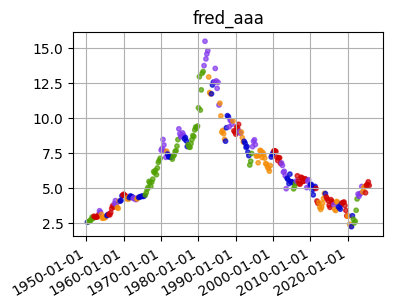



fred_aaa_d1


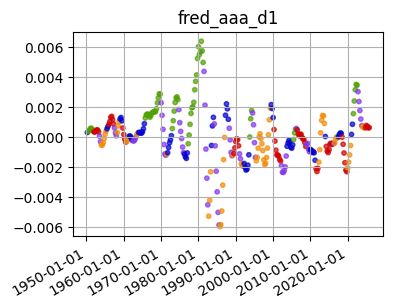



fred_aaa_d2


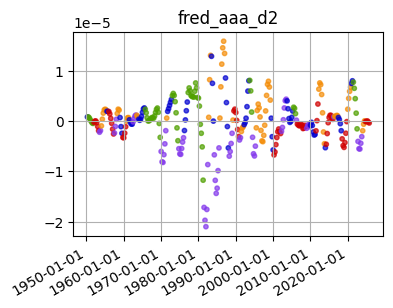



fred_aaa_d3


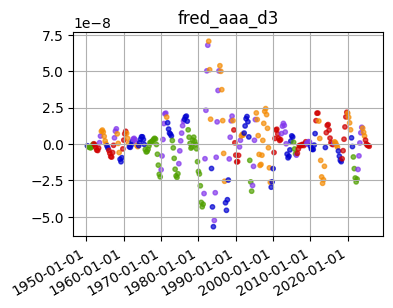



fred_baa


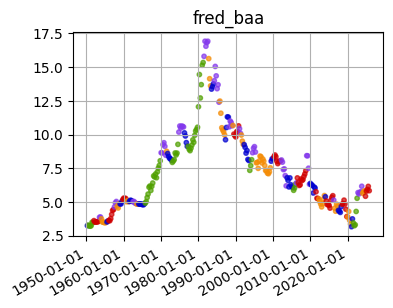



fred_baa_d1


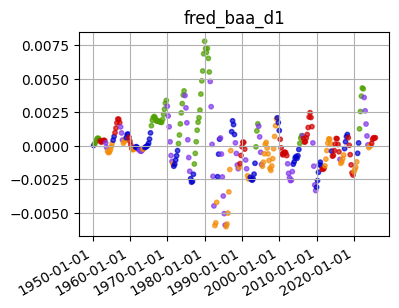



fred_baa_d2


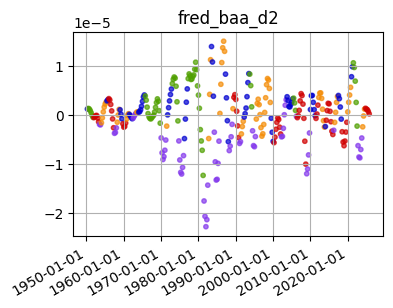



fred_baa_d3


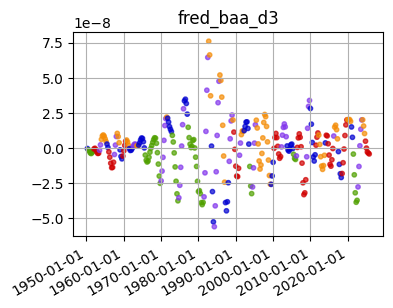



fred_gs10


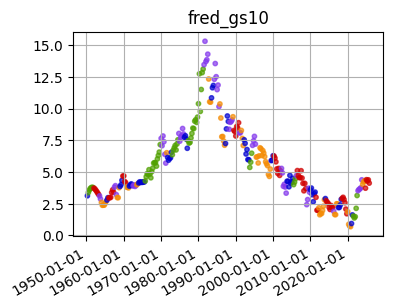



fred_gs10_d1


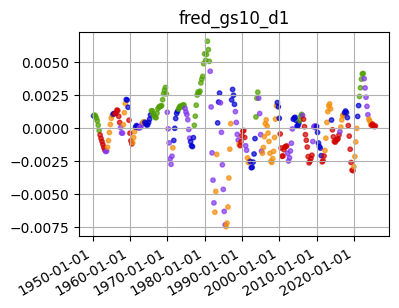



fred_gs10_d2


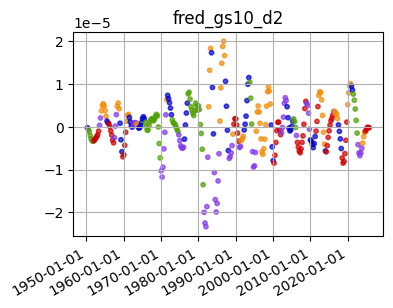



fred_gs10_d3


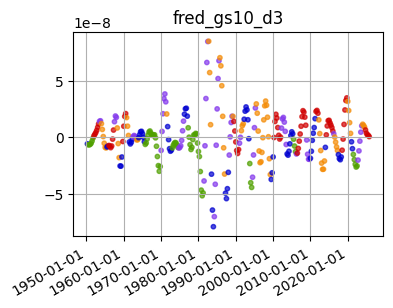



fred_tb3ms


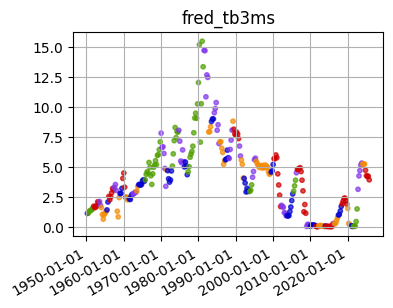



fred_tb3ms_d1


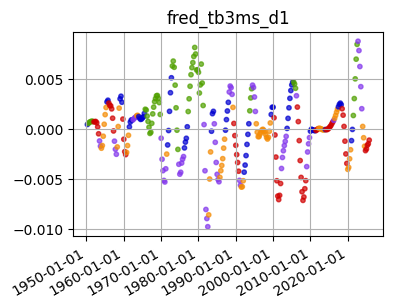



fred_tb3ms_d2


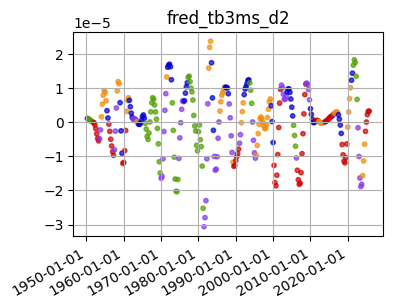



fred_tb3ms_d3


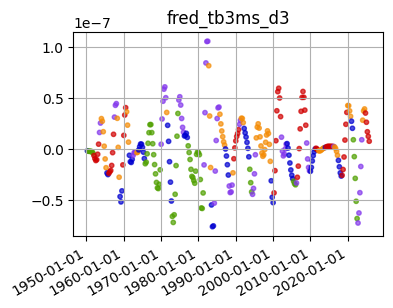



gdp_growth


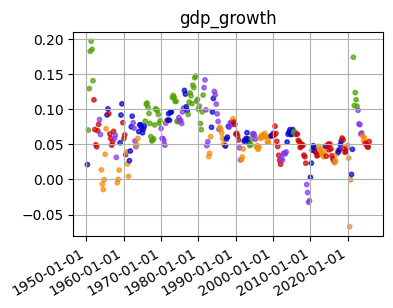



gdp_growth_d1


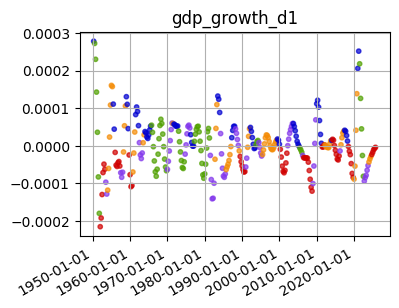



gdp_growth_d2


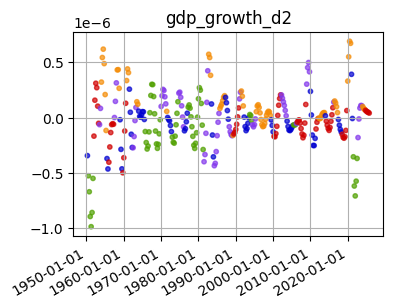



gdp_growth_d3


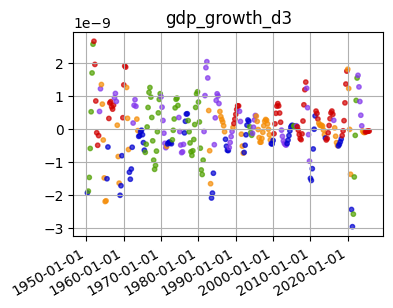



log_cape_shiller


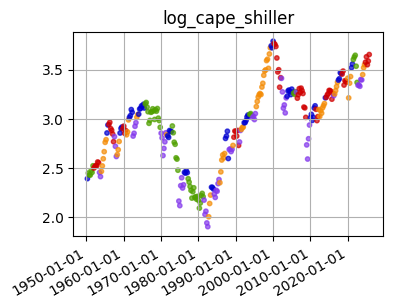



log_cape_shiller_d1


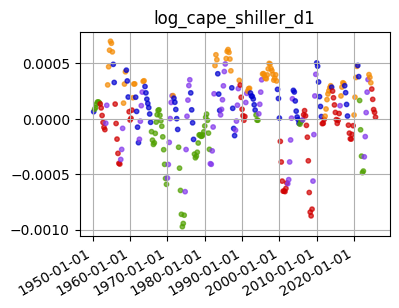



log_cape_shiller_d2


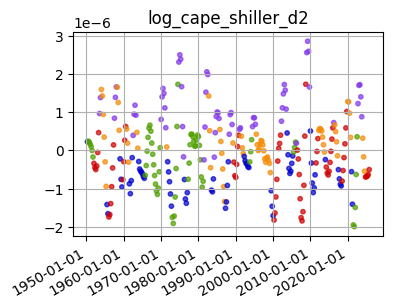



log_cape_shiller_d3


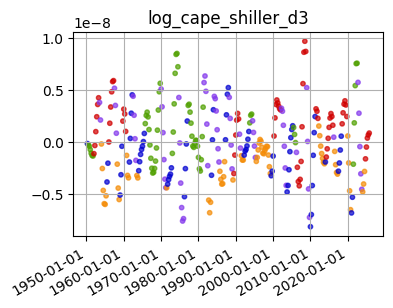



log_cpi


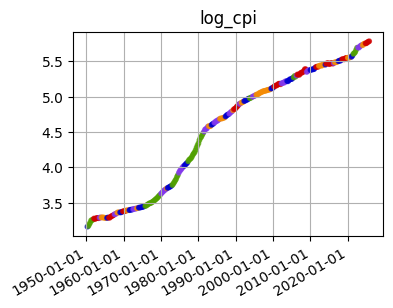



log_cpi_d1


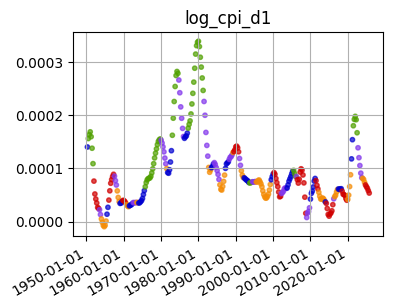



log_cpi_d2


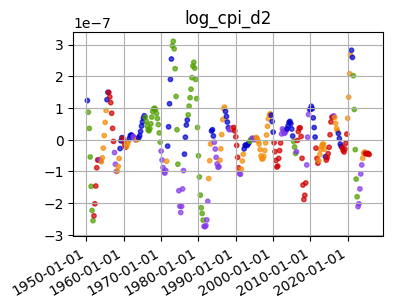



log_cpi_d3


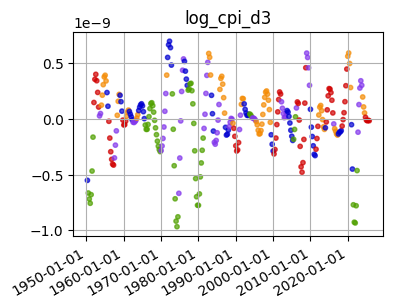



log_div_yield


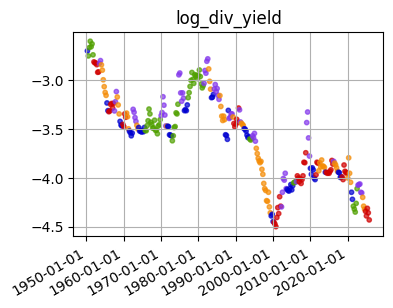



log_div_yield2


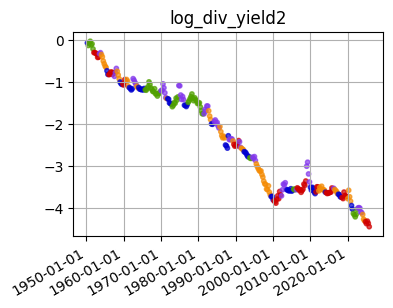



log_div_yield2_d1


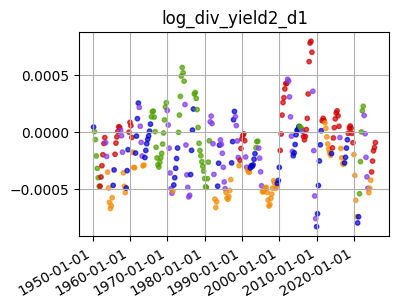



log_div_yield2_d2


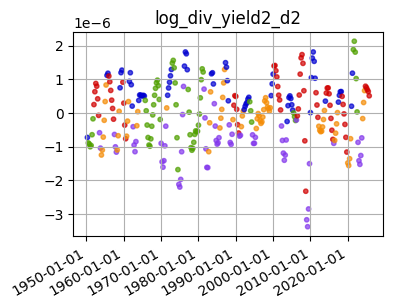



log_div_yield2_d3


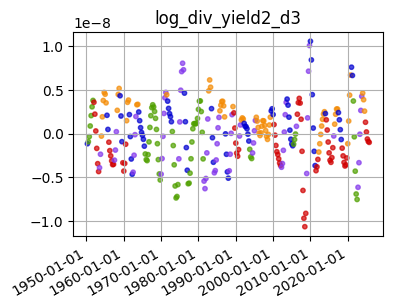



log_div_yield_d1


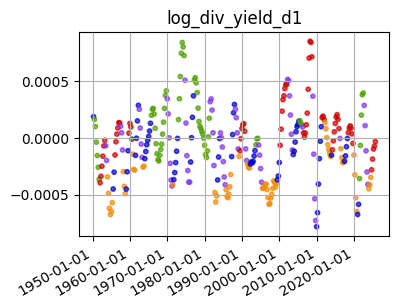



log_div_yield_d2


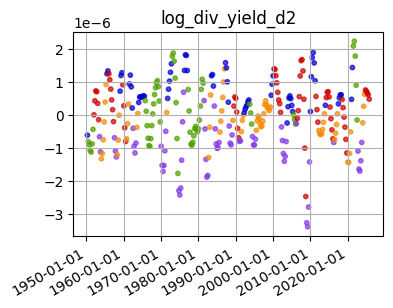



log_div_yield_d3


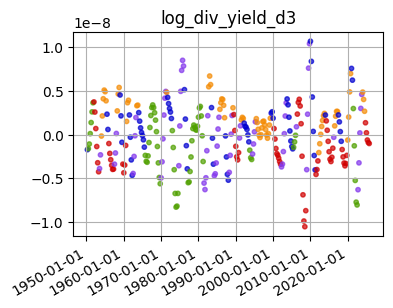



log_dividend


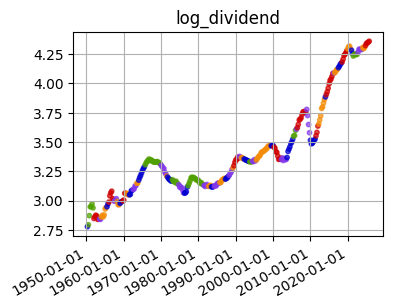



log_dividend_d1


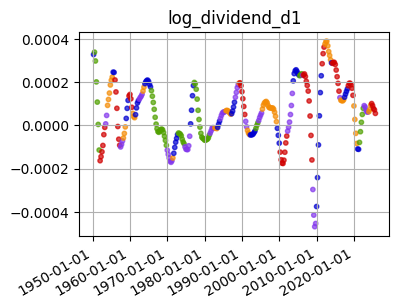



log_dividend_d2


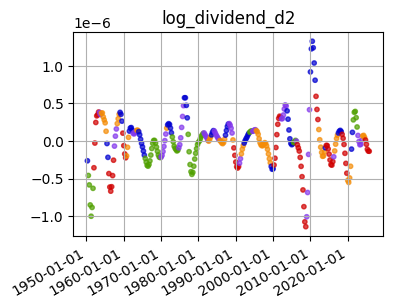



log_dividend_d3


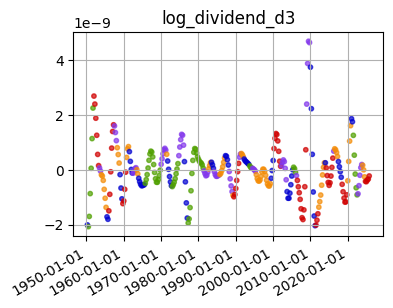



log_earn


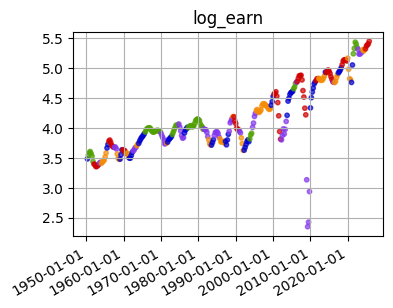



log_earn_d1


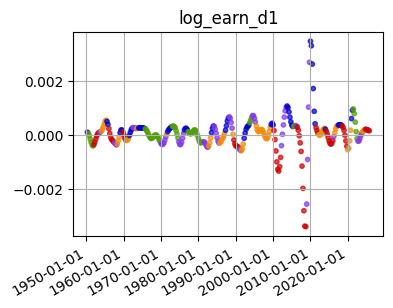



log_earn_d2


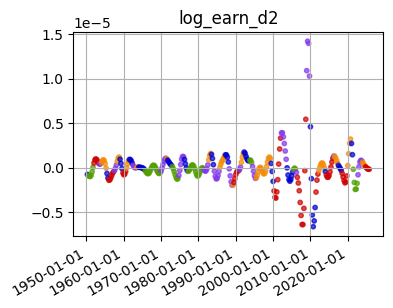



log_earn_d3


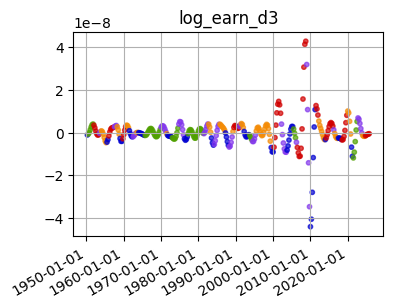



log_earn_yld


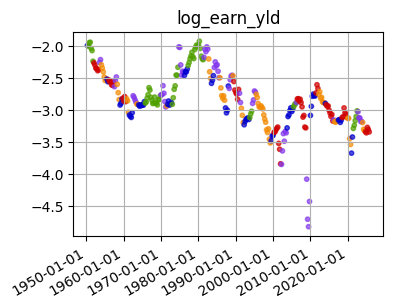



log_earn_yld_d1


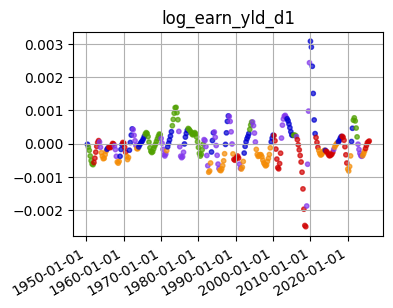



log_earn_yld_d2


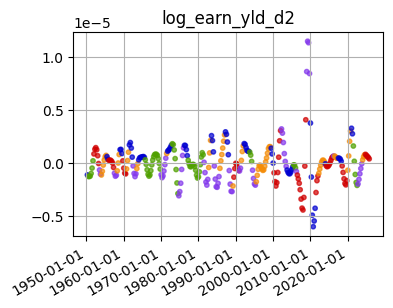



log_earn_yld_d3


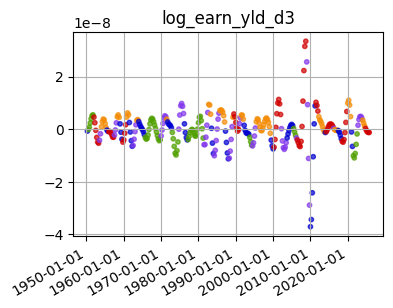



log_fed_debt


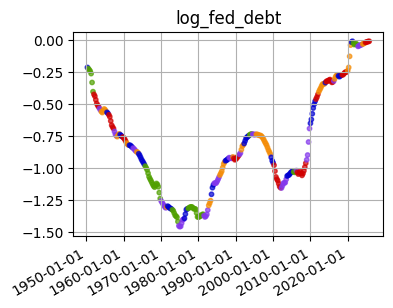



log_fed_debt_d1


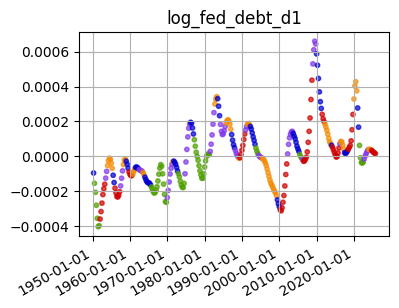



log_fed_debt_d2


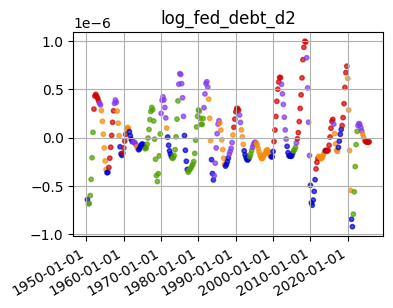



log_fed_debt_d3


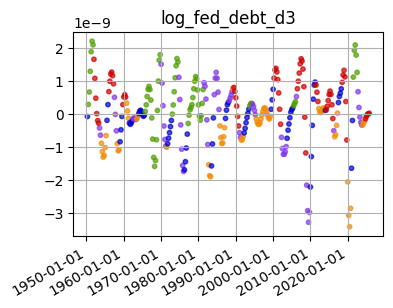



log_fred_cpi


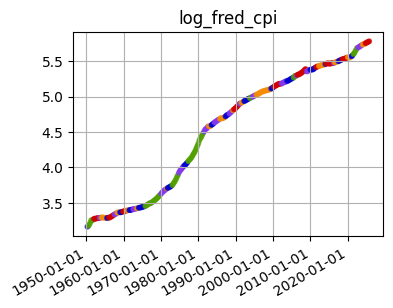



log_fred_cpi_d1


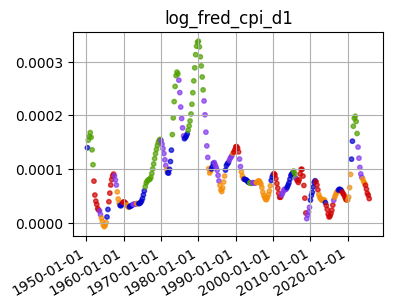



log_fred_cpi_d2


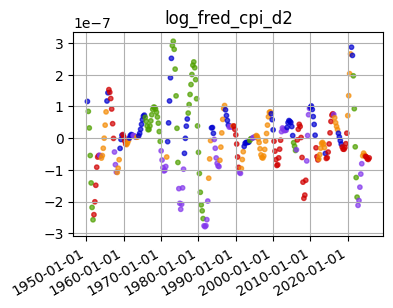



log_fred_cpi_d3


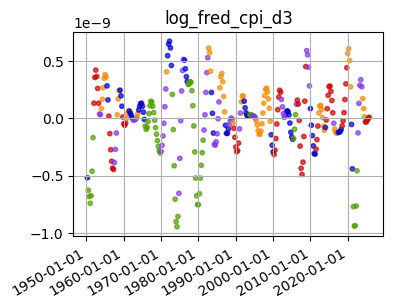



log_fred_gdp


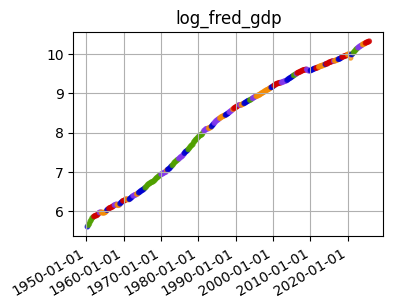



log_fred_gdp_d1


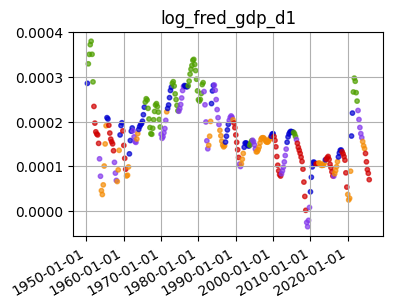



log_fred_gdp_d2


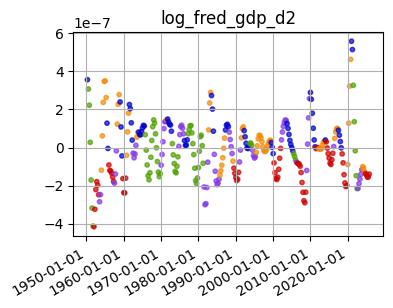



log_fred_gdp_d3


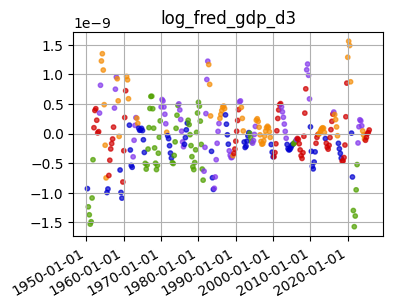



log_fred_gnp


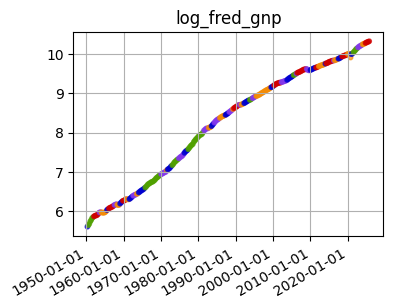



log_fred_gnp_d1


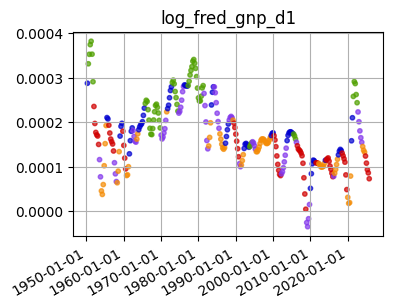



log_fred_gnp_d2


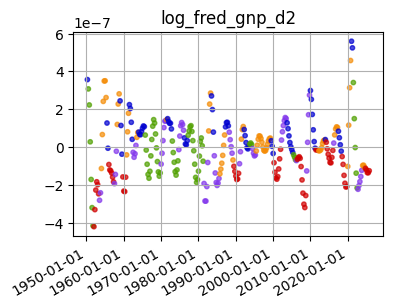



log_fred_gnp_d3


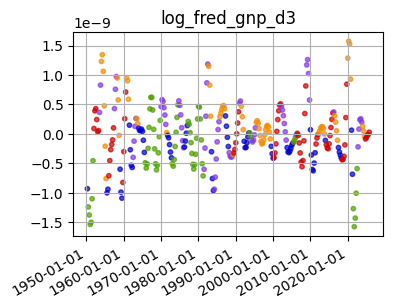



log_gdp


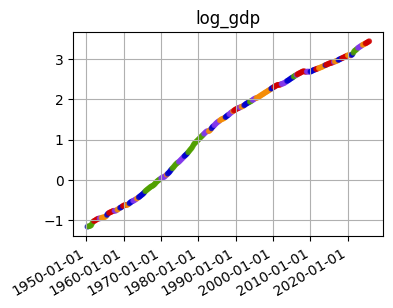



log_gdp_d1


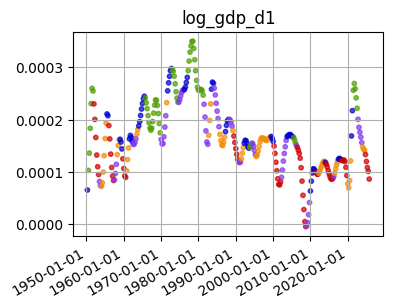



log_gdp_d2


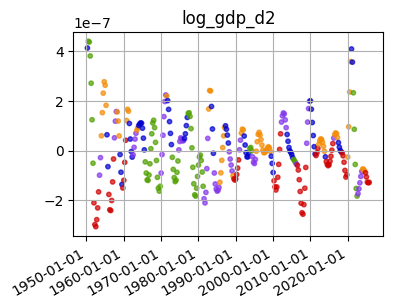



log_gdp_d3


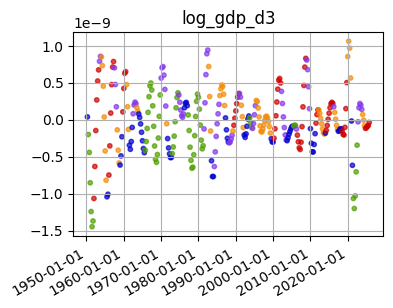



log_price_div


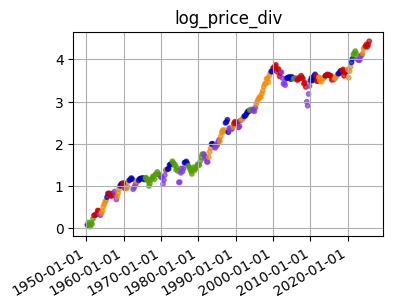



log_price_div_d1


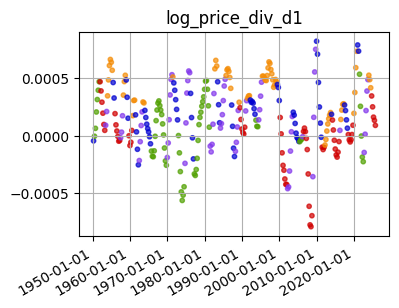



log_price_div_d2


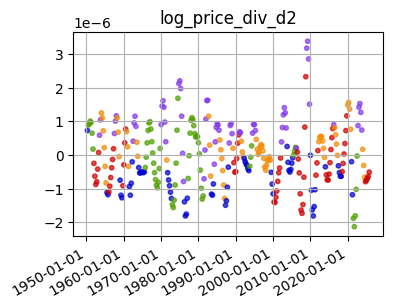



log_price_div_d3


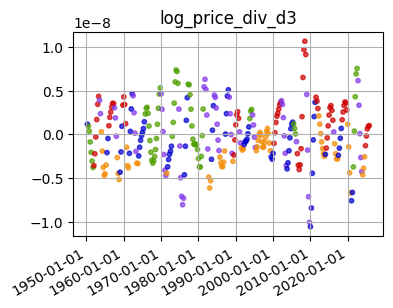



log_price_gdp


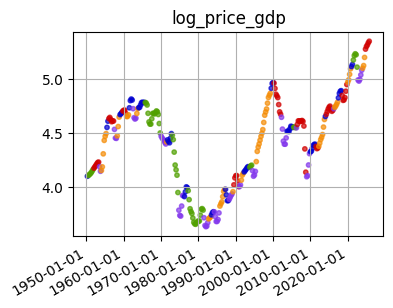



log_price_gdp2


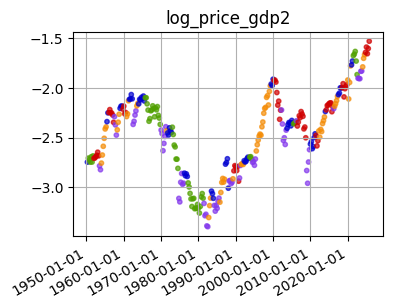



log_price_gdp2_d1


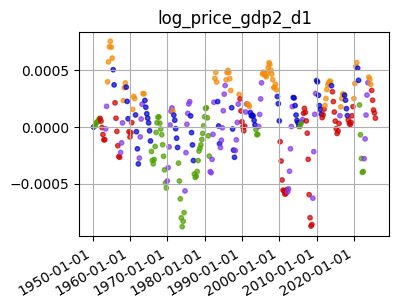



log_price_gdp2_d2


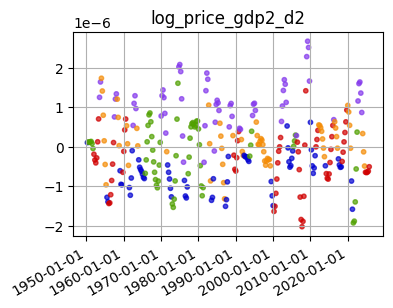



log_price_gdp2_d3


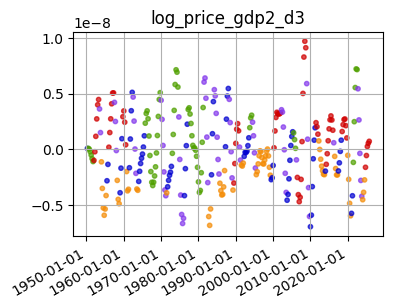



log_price_gdp_d1


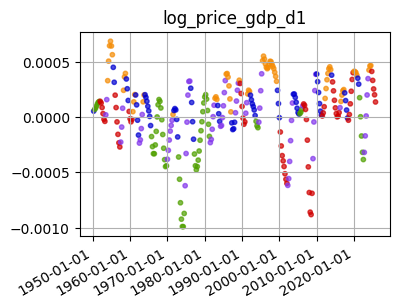



log_price_gdp_d2


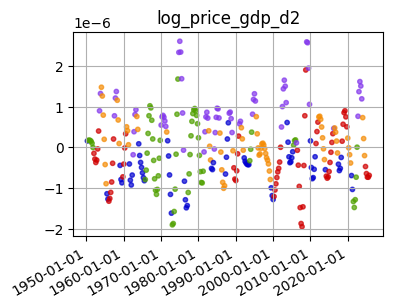



log_price_gdp_d3


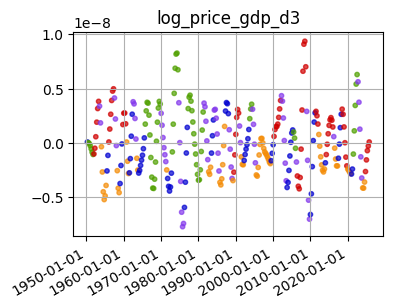



log_price_gnp2


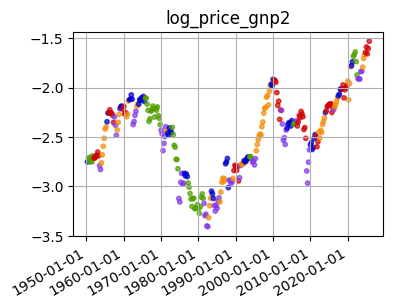



log_price_gnp2_d1


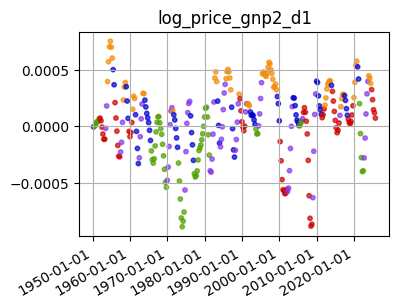



log_price_gnp2_d2


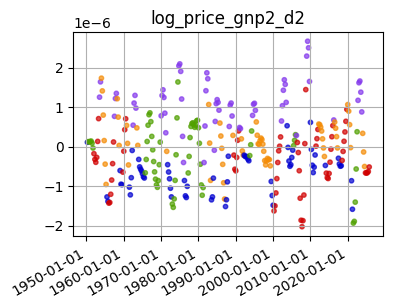



log_price_gnp2_d3


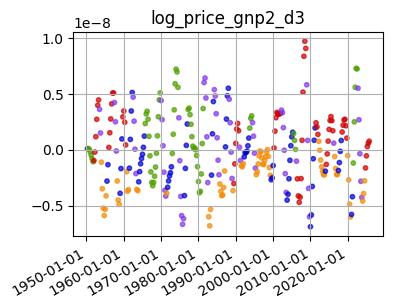



log_real_gdp


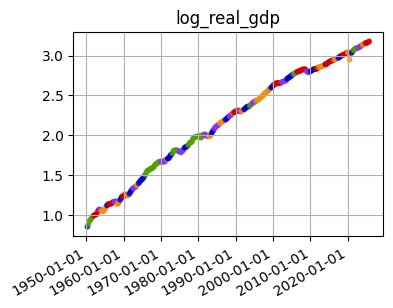



log_real_gdp_d1


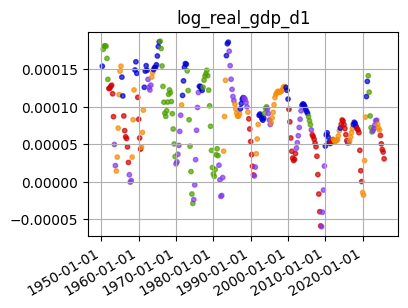



log_real_gdp_d2


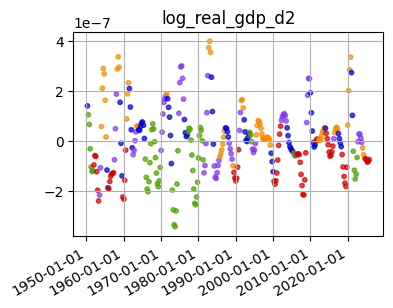



log_real_gdp_d3


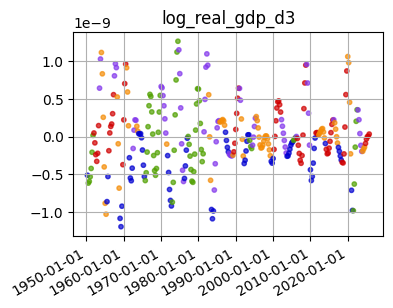



log_real_price2


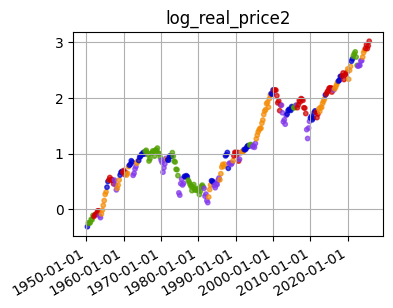



log_real_price2_d1


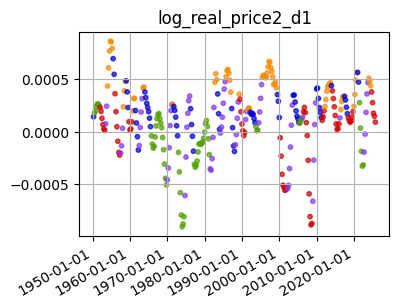



log_real_price2_d2


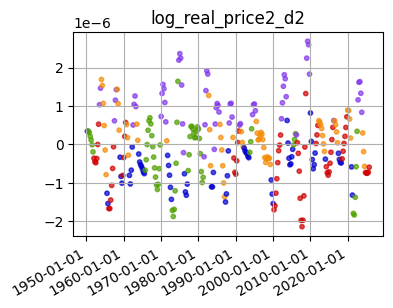



log_real_price2_d3


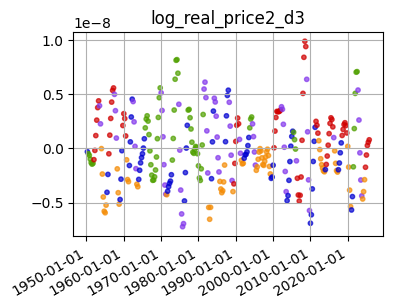



log_real_price3


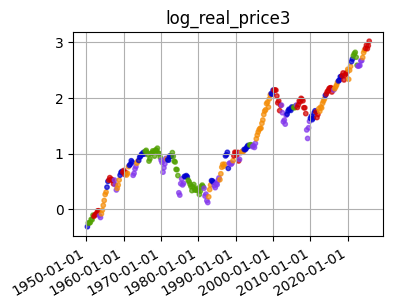



log_real_price3_d1


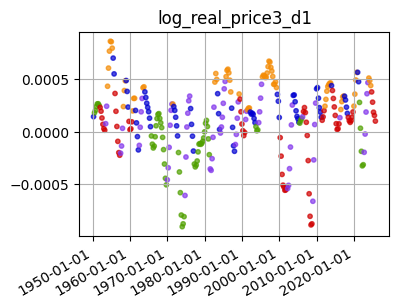



log_real_price3_d2


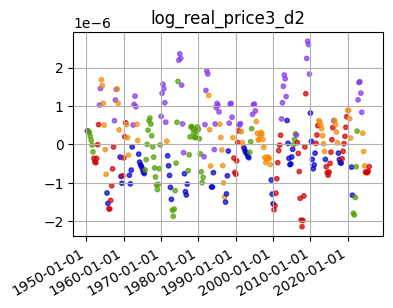



log_real_price3_d3


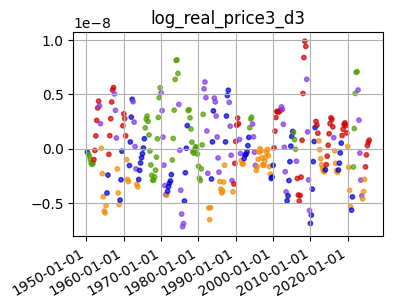



log_real_price_gdp2


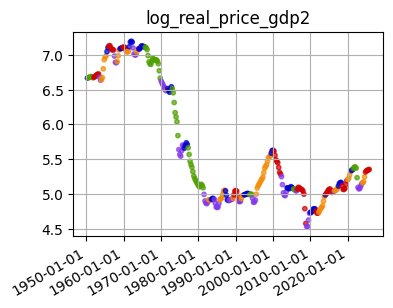



log_real_price_gdp2_d1


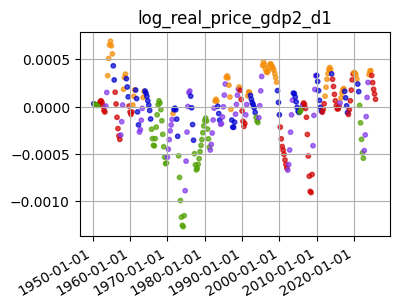



log_real_price_gdp2_d2


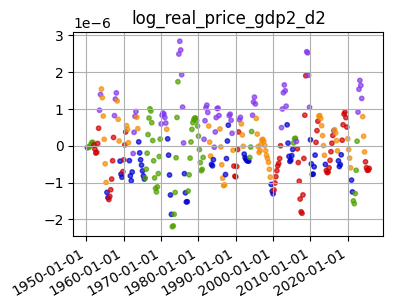



log_real_price_gdp2_d3


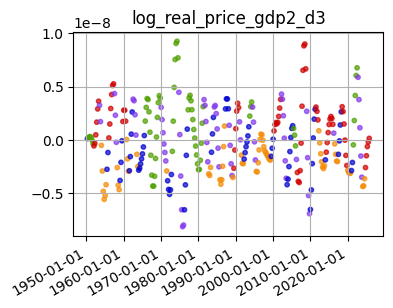



log_sp500


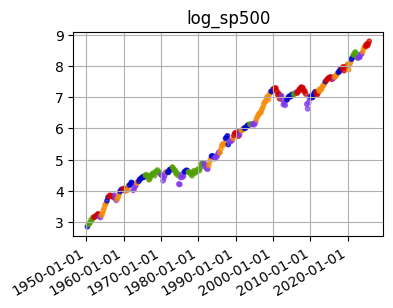



log_sp500_adj


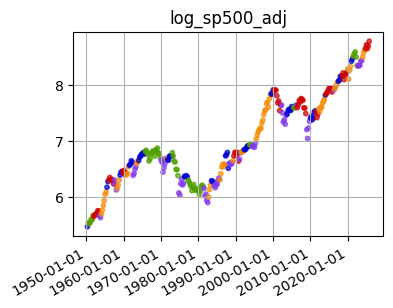



log_sp500_adj_d1


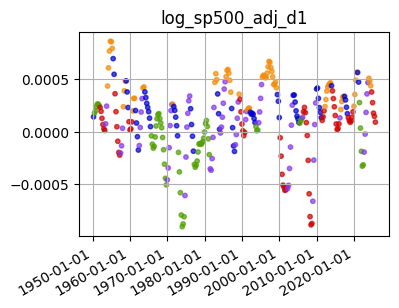



log_sp500_adj_d2


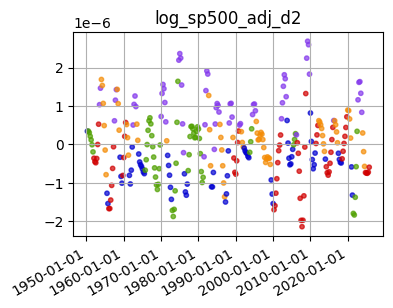



log_sp500_adj_d3


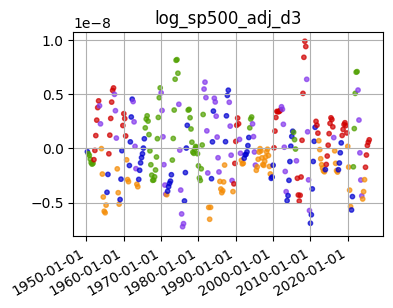



log_sp500_d1


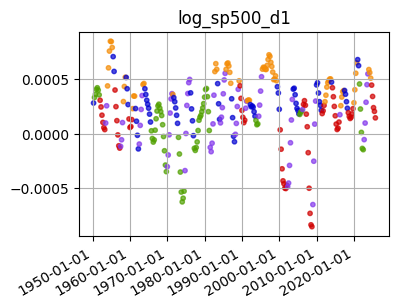



log_sp500_d2


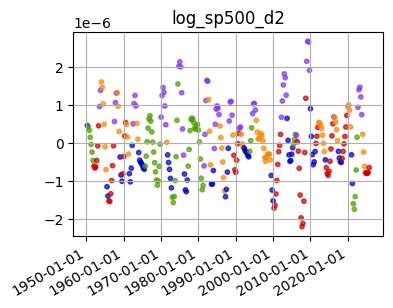



log_sp500_d3


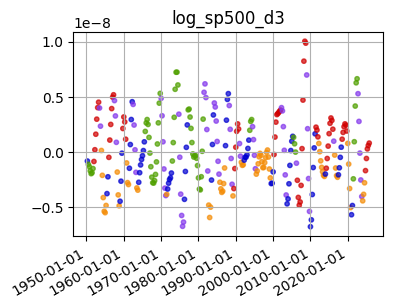



log_us_pop


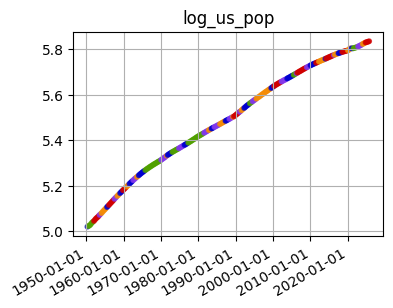



log_us_pop_d1


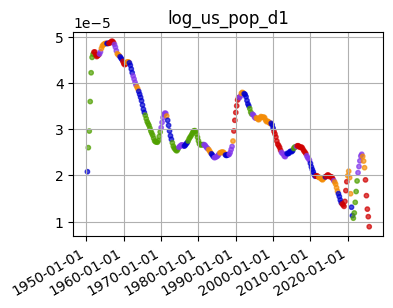



log_us_pop_d2


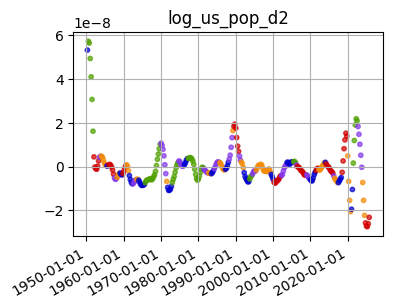



log_us_pop_d3


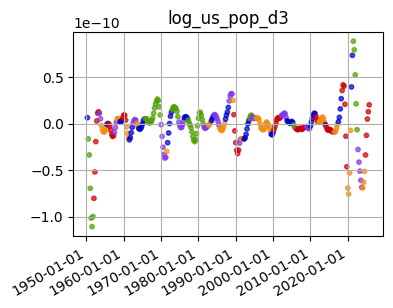



real_gdp_growth


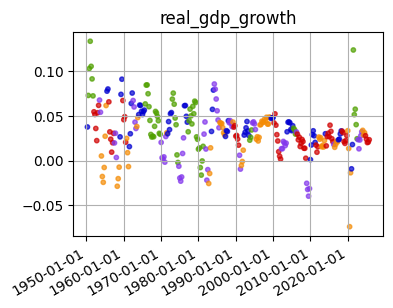



real_gdp_growth_d1


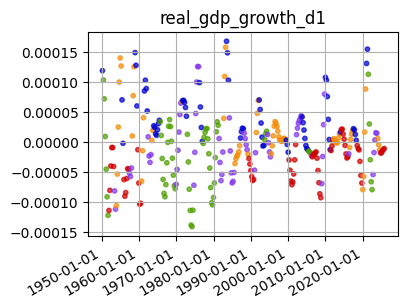



real_gdp_growth_d2


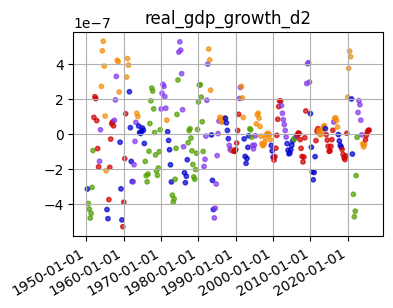



real_gdp_growth_d3


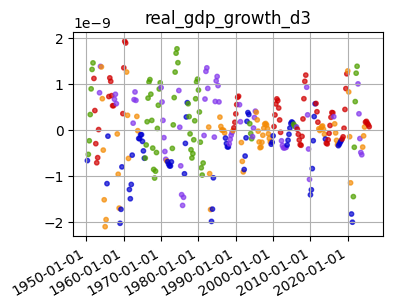



real_gdp_per_cap


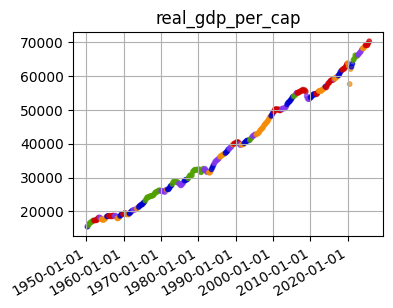



real_gdp_per_cap_d1


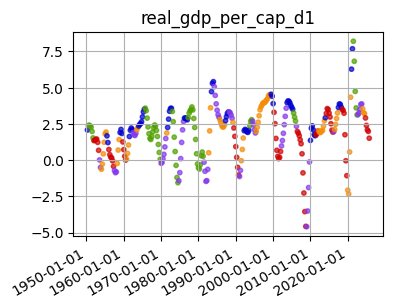



real_gdp_per_cap_d2


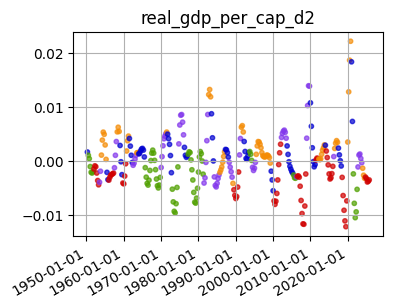



real_gdp_per_cap_d3


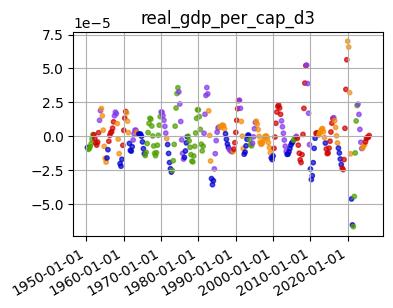



sp500_pe


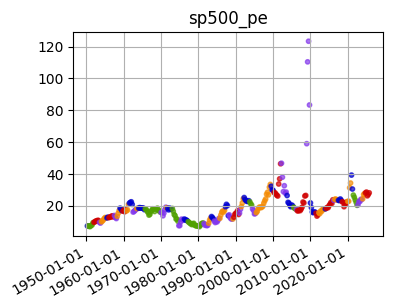



sp500_pe_d1


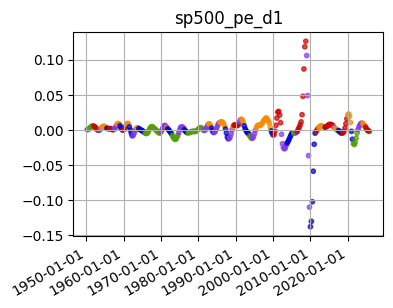



sp500_pe_d2


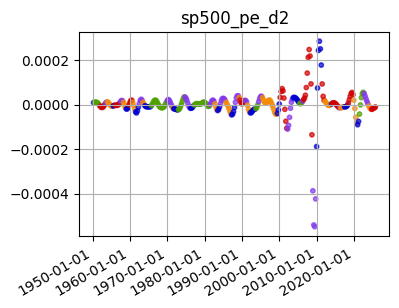



sp500_pe_d3


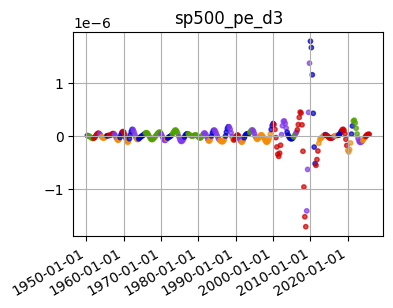



us_infl


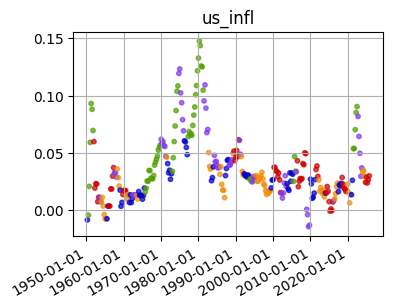



us_infl_d1


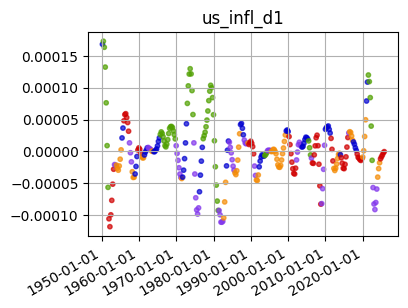



us_infl_d2


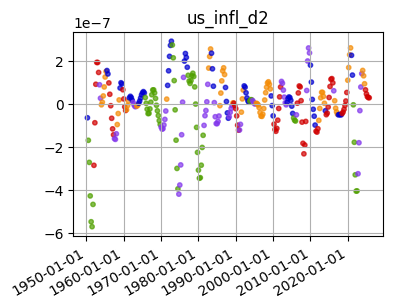



us_infl_d3


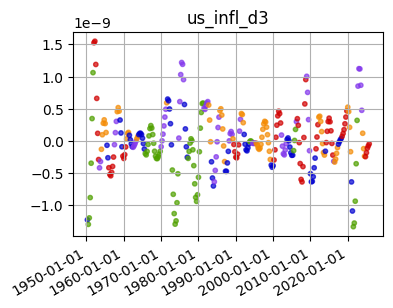



us_pop_growth


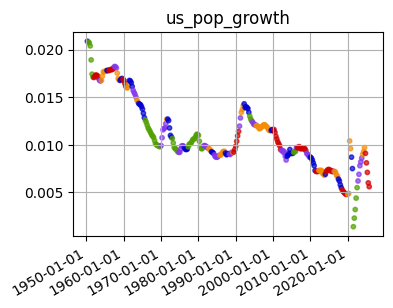



us_pop_growth_d1


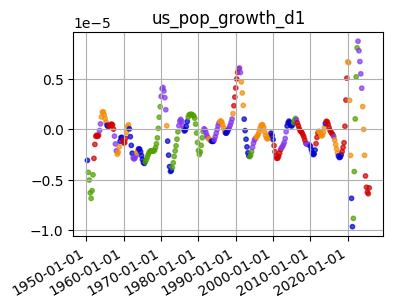



us_pop_growth_d2


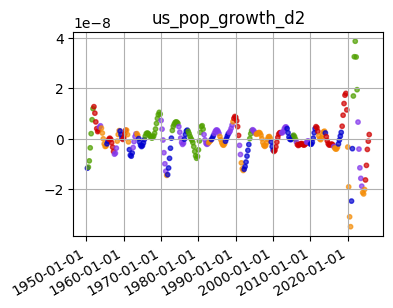



us_pop_growth_d3


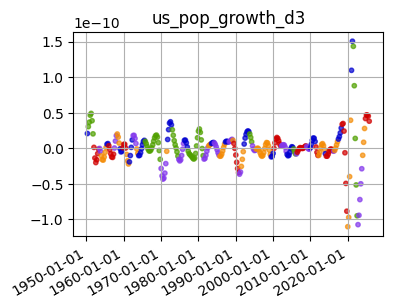

In [42]:
for col_name in quarterly_df.columns:
    if col_name == 'market_code':
        continue

    print(col_name)

    orig_all_dates = quarterly_df.index.values
    orig_all_date_string = [datetime.strptime(str(d), '%Y-%m-%d').date() for d in orig_all_dates]
    values = quarterly_df[col_name].values
    regimes = quarterly_df['market_code'].values
    num_nulls = int(quarterly_df[col_name].isna().sum())
    # print("min date = " + str(orig_all_date_string[0]))
    # print("max date = " + str(orig_all_date_string[-1]))
    # print("num nulls " + str(num_nulls) )

    fig, ax = plt.subplots(figsize=(4, 3))

    plt.scatter(
        x=orig_all_date_string, y=values,
        c=reduced_df['balanced_cluster'], cmap=my_cmap, # good maps include 'viridis' 'Set1' 'tab10' 'Accent' 'rainbow' 'turbo'
        s=10, # use 20 for a 8x5 plot, but 10 is better for smaller plots
        alpha=0.7,
        linestyle='solid', marker='o')

    formatter = mdates.DateFormatter('%Y-%m-%d')
    ax.xaxis.set_major_formatter(formatter)
    fig.autofmt_xdate()
    plt.title(col_name)
    plt.grid(True)
    plt.show()

    print()
    print()
